In [3]:
import pickle
# import matlab.engine
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import scipy
from scipy import signal
import pickle
import pandas as pd
# there were a lot of deprecation warnings
import warnings
warnings.filterwarnings('ignore', category=DeprecationWarning)
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from scipy.signal import butter,filtfilt

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import pickle
import os
from sklearn.cluster import AgglomerativeClustering

# there were a lot of deprecation warnings
import warnings

warnings.filterwarnings('ignore', category=DeprecationWarning)


def get_hour(hour: int, dir='/home/yandex/BrainW2021/projects/ML_Ofir_Eden_Eden/Data/pickel_files'):
    """
    Gets data of a specific hour as np.array,
    given the directory and files are in the specific format:
    file name is 'Hour#' and is in a directory called dir,
    prints data's size
    :param hour: hour in int
    :param dir: name of data directory
    :return: data as np.array (prints it's size)
    """
    filename = dir + os.path.sep + 'Hour' + str(hour)
    # TODO: if using jupyter, replace with following line:
    # filename = 'Hour' + str(hour)
    with open(filename, 'rb') as data_file:
        data = pickle.load(data_file)
        data = np.array(data)
        print("data.size = " + str(data.size))
        return data


def plot_data(data: np.array, title: str):
    """
    :param data: raw recording
    :param title: title of graph
    shows / saves a plot of the data
    """
    plt.figure(figsize=(13, 4))
    plt.plot(data)
    plt.title(title, fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.xlabel('Time', fontsize=16)
    plt.show()
#     plt.savefig('data')
    plt.close()


def welch_psd_per_bin(data: np.array, bin_length_sec=10, sf=20000,
                      nperseg=20000, noverlap=10000, scaling='spectrum'):
    """
    :param data: 1 hour of data
    :param bin_length_sec:  length of bins in seconds
    :params sf: sample frequency (samples/second)
    :param nperseg: length of segment in samples
    :param noverlap: overlap between segments in samples
    :param scaling: no reason to change default
    :return: array of relevant frequencies, array of their magnitudes
    """
    samples_per_bin = bin_length_sec * sf
    spectrum = []
    for i in range(int(data.size / samples_per_bin)): # for each bin compute the spectrum
        single_bin = data[i * samples_per_bin:samples_per_bin * (i + 1)]
        frequencies, density = signal.welch(single_bin, fs=sf, nperseg=nperseg, noverlap=noverlap, scaling=scaling)
        spectrum.append(density)
    return frequencies, np.array(spectrum)


def show_spectogram(frequencies, spectrum: np.array, size=360, title='STFT Magnitude'):
    """
    :param frequencies: relevant frequencies - eventually takes the first 30
    :param spectrum: magnitudes of the relevant frequencies in each bin
    :param size: number of bins (default is one hour with bins' length 10sec - 360
    :return: shows / saves spectogram
    """
    # segmentation and plot
    plt.figure()
    plt.pcolormesh([i for i in range(size)], frequencies[:30], np.abs(np.log(np.transpose(spectrum[:, :30]))),
                   shading='gouraud')
    plt.title(title)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time')
    plt.show()
#     plt.savefig('spectogram')
    plt.close()


def show_normalized_spectogram(frequencies, spectrum: np.array, no_show=False, size=360, title='STFT Normalized Magnitude'):
    """
    :param frequencies: relevant frequencies - eventually takes the first 30
    :param spectrum: magnitudes of the relevant frequencies in each bin
    :param size: number of bins (default is one hour with bins' length 10sec - 360
    :param no_show: if there's no need to show the spectogram
    :return: normalized magnitudes for the frequencies (shows/saves spectogram figure)
    """
    # normalize spectogram data
    low_freq_power = spectrum[:, :30]  # all bins, frequencies upto 30Hz
    # calculate avarage freq power
    avg_freq_power = low_freq_power.mean(axis=0)  # for each frequency, its average magnitude
    norm_freq_power = low_freq_power / avg_freq_power
    # segmentation and plot
    if no_show:
        return norm_freq_power
    plt.figure()
    plt.pcolormesh([i for i in range(size)], frequencies[:30], np.abs((np.transpose(norm_freq_power))),
                   shading='gouraud')
    plt.title(title)
    plt.ylabel('Frequency [Hz]')
    plt.xlabel('Time')
    plt.show()
#     plt.savefig('normalized_spectogram')
    plt.close()
    return norm_freq_power


def show_corr_mat(norm_freq_power, no_show=False):
    low_freq_magnitudes = np.abs(norm_freq_power)
    # compute correlation matrix of frequencies magnitudes
    corr_mat = np.corrcoef(low_freq_magnitudes)  # by pearson
    corr_mat.shape
    if no_show:
        return corr_mat, low_freq_magnitudes
    plt.figure()
    plt.imshow(corr_mat)
    plt.colorbar()
    plt.show()
    #     plt.savefig('corr_mat')
    plt.close()
    return corr_mat, low_freq_magnitudes


def show_clustered_data(corr_mat, low_freq_magnitudes, no_show=False):
    # re-organize the segments according to clusters
    ward_clusters = AgglomerativeClustering(linkage='ward').fit(corr_mat)
    indices = np.argsort(ward_clusters.labels_)
    magnitudes_by_clusters = low_freq_magnitudes[indices]
    corr_mat_by_clusters = np.corrcoef(magnitudes_by_clusters)
    corr_mat_by_clusters.shape
    if no_show:
        return ward_clusters
    plt.figure()
    plt.imshow(corr_mat_by_clusters)
    plt.clim(-1, 1)
    plt.colorbar()
    plt.show()
    #     plt.savefig('clustered_data')
    plt.close()
    return ward_clusters


def divide_to_clusters(ward_clusters, norm_freq_power):
    low_freq_magnitudes = (np.abs(norm_freq_power[:, :30]))
    lables = ward_clusters.labels_
    indxes_cls1 = np.where(lables == 0)[0]
    indxes_cls2 = np.where(lables == 1)[0]
    cls1 = low_freq_magnitudes[indxes_cls1, :30]
    cls2 = low_freq_magnitudes[indxes_cls2, :30]
    return cls1, cls2


# cal the freqs
def avrg_freq_per_cluster(cls_group):  # cls_group is for each bin in cls, its spectrum
    cls_len = cls_group.shape[0]  # num of bins in cls
    relevant_freqs = cls_group.shape[1]  # num of different frequencies
    cls_freqs = [0] * relevant_freqs  # 0 for each frequency
    for vec in cls_group:  # for each bin's spectrum
        for i in range(relevant_freqs):  # for each frequency
            cls_freqs[i] += vec[i]  # cls_freqs[i] += magnitude of that frequency in that bin
    cls_freqs = np.divide(cls_freqs, cls_len)  # cls_freqs is now mean magnitude for each frequency in cls
    return cls_freqs


def show_graph(cls1_freqs, cls2_freqs, frequencies):
    plt.figure()
    plt.plot(frequencies[:30], cls1_freqs)
    plt.plot(frequencies[:30], cls2_freqs)
    plt.show()
    #     plt.savefig('graph')
    plt.close()
    return


def all(data):
    frequencies, spectrum = welch_psd_per_bin(data)
    show_spectogram(frequencies, spectrum)
    norm_freq_power = show_normalized_spectogram(frequencies, spectrum)
    corr_mat, low_freq_magnitudes = show_corr_mat(norm_freq_power)
    ward_clusters = show_clustered_data(corr_mat, low_freq_magnitudes)
    cls1, cls2 = divide_to_clusters(ward_clusters, norm_freq_power)
    show_graph(avrg_freq_per_cluster(cls1), avrg_freq_per_cluster(cls2), frequencies)


def graph_e_row(data):
    frequencies, spectrum = welch_psd_per_bin(data)
    norm_freq_power = show_normalized_spectogram(frequencies, spectrum, no_show=True)
    corr_mat, low_freq_magnitudes = show_corr_mat(norm_freq_power, no_show=True)
    ward_clusters = show_clustered_data(corr_mat, low_freq_magnitudes, no_show=True)
    cls1, cls2 = divide_to_clusters(ward_clusters, norm_freq_power)
    delta = np.arange(4)
    beta = np.arange(4, 30)
    sleep_states = np.array([0.0] * norm_freq_power.shape[0])
    for i, bin in enumerate(norm_freq_power):  # 30 minutes
        delta_magnitude_bin = bin[delta].mean()  # average magnitude of delta frequencies in bin
        beta_magnitude_bin = bin[beta].mean()  # average magnitude of beta frequencies in bin
        sleep_states[i] = delta_magnitude_bin / beta_magnitude_bin
    return sleep_states


def show_graph_e():
    sleep_states = np.array([[0.0] * 180] * 32)
    for i in range(0, 32, 2):
        data = get_hour(int(i / 2))
        sleep_states_hour = graph_e_row(data)
        sleep_states[i] = sleep_states_hour[:180]
        sleep_states[i + 1] = sleep_states_hour[180:]
    plt.figure(figsize=(8.67, 5.33))
    plt.imshow(sleep_states, extent=[0, 30, 0, 17])
    cbar = plt.colorbar()
    cbar.set_label('delta to beta ratio', rotation=270)
    plt.show()
    #     plt.savefig()
    plt.close()

/home/yandex/BrainW2021/projects/ML_Ofir_Eden_Eden/Python_env/liz/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:35: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  eps=np.finfo(np.float).eps,
/home/yandex/BrainW2021/projects/ML_Ofir_Eden_Eden/Python_env/liz/lib/python3.7/site-packages/sklearn/linear_model/least_angle.py:597: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/

In [5]:
# functions for easy work
     
def plot_data(data: np.array, title: str):
    plt.figure(figsize=(13,4))
    plt.plot(data)
    plt.title(title, fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.show()
    
def low_pass_filter(data: np.array, T=3600.0, fs=20000.0, cutoff=100, order=2):
    # Filter requirements.
    # T = 3600.0         # Sample Period, sec
    # fs = 20000.0       # sample rate, Hz
    # cutoff = 100      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
    # order = 2       # sin wave can be approx represented as quadratic
    nyq = 0.5 * fs  # Nyquist Frequency
    n = int(T * fs) # total number of samples
    
    # Filter the data,
    normal_cutoff = cutoff / nyq
    # Get the filter coefficients
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    y = filtfilt(b, a, data)
    return y
    
def downsample(data: np.array, sample_rate=20000.0, downsample_rate=250.0):
    # sample_rate = 20000.0
    # downsample_rate = 250.0
    downsample_factor = sample_rate / downsample_rate
    downsampled_data = scipy.signal.decimate(data, int(downsample_factor))
    return downsampled_data

def autocorrelation_order(data: np.array, log_range=7):
    autocorrelation = []
    correlation = np.corrcoef(data, data)[0,1]
    print(correlation)
    autocorrelation.append(correlation)
    for log_shift in range(7):
        shift = 10 ** log_shift
        correlation = np.corrcoef(data[:-shift], data[shift:])[0,1]
        print(shift)
        print(correlation)
        autocorrelation.append(correlation)
    plt.plot(autocorrelation)
    plt.title('Autocorrelation: change in order size shifts', fontsize=20)
    plt.show()
    
def my_autocorrelation(data: np.array, shifts_range, shifts_jump=1, shifts_lst=[]):
    autocorrelation = []
    correlation = np.corrcoef(data, data)[0,1]
    autocorrelation.append(correlation)
    if shifts_lst != []:
        shifts = shifts_lst
    else:
        shifts = range(1, shifts_range, shifts_jump)
    for shift in shifts:
        correlation = np.corrcoef(data[:-shift], data[shift:])[0,1]
        if shifts_lst != []:
            print("shift = " + str(shift))
            print("correlation = " + str(correlation))
        autocorrelation.append(correlation)
    return autocorrelation

def plot_statesmodel_autocorrelation(data: np.array):
    print(data.size)
    with mpl.rc_context():
        mpl.rc("figure", figsize=(13,4))
        plot_acf(data)
        
def data_presentation(data: np.array, start:tuple, end: tuple):
    plot_data(data, 'Raw Data - Wakefulness : %d:%d:%d-%d:%d:%d' % (start[0], start[1], start[2], end[0], end[1], end[2]))
    # low pass filter
    lpf_data = low_pass_filter(data)
    plot_data(lpf_data, 'Raw Data - Wakefulness : %d:%d:%d-%d:%d:%d, Butter Low Pass Filter' % (start[0], start[1], start[2], end[0], end[1], end[2]))
    # downsample
#     ds_data = downsample(data)
#     plot_data(ds_data, 'Raw Data - Wakefulness : %d:%d:%d-%d:%d:%d, downsampled to 250Hz' % (start[0], start[1], start[2], end[0], end[1], end[2]))

def minute_to_sample(minute: int, sample_rate=20000, start_sample=0):
    return second_to_sample(60*minute, start_sample)

def second_to_sample(second: int, sample_rate=20000, start_sample=0):
    return second * 20000 + start_sample

In [6]:
data14 = get_hour(14)

data.size = 72000000


In [10]:
def band_pass_filter(data: np.array, T=600.0, fs=20000.0, around=1, order=2):
    # Filter requirements.
    # T = 3600.0         # Sample Period, sec
    # fs = 20000.0       # sample rate, Hz
    # cutoff = 100      # desired cutoff frequency of the filter, Hz ,      slightly higher than actual 1.2 Hz
    # order = 2       # sin wave can be approx represented as quadratic
    nyq = 0.5 * fs  # Nyquist Frequency (10000)
    n = int(T * fs) # total number of samples
    
    # Filter the data,
#     print(cutoff)
#     print(nyq)
    normal_cutoff_h = 2* (around / nyq)
    normal_cutoff_l = 0.5*(around / nyq)
#     print(normal_cutoff_h)
#     Get the filter coefficients
    b, a = butter(order, [normal_cutoff_l,normal_cutoff_h], btype='bandpass', analog=False)
    y = filtfilt(b, a, data)
    return y

0.0002


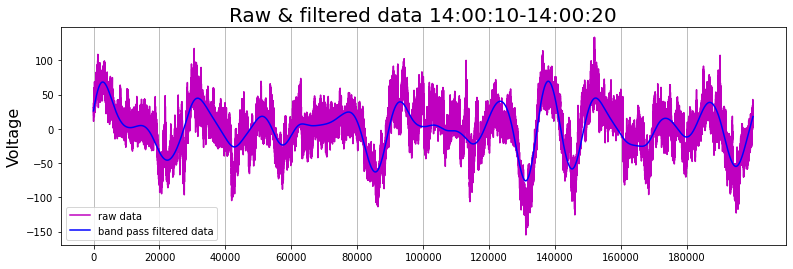

In [8]:
fig, ax = plt.subplots(figsize=(13,4))
plt.plot(data14[second_to_sample(10):second_to_sample(20)], 'm-', label='raw data')
lpf = band_pass_filter(data14)
plt.plot(lpf[second_to_sample(10):second_to_sample(20)], 'b-', label='band pass filtered data')
plt.legend(loc='best')
ax.set_xticks(np.arange(0, 200000, 20000), minor=False)
ax.xaxis.grid(True, which='major')
plt.title('Raw & filtered data 14:00:10-14:00:20', fontsize=20)
plt.ylabel('Voltage', fontsize=16)
plt.show()

In [ ]:
for i in range(0, 3600, 10):
    fig, ax = plt.subplots(figsize=(13,4))
    plt.plot(data14[second_to_sample(i):second_to_sample(i+10)], 'm-', label='raw data')
    bpf = band_pass_filter(data14, T=600, around = 1)
    plt.plot(bpf[second_to_sample(i):second_to_sample(i+10)], 'b-', label='band pass filtered data')
    
    """
    F = 1
    T = 10
    Fs = 20000
    Ts = 1./Fs
    N = int(T/Ts)

#     t = np.linspace(0, T, N)
    signal = np.sin(2*np.pi*F*t + 600)

    plt.plot(100*signal, 'g-', label='sine wave of 1HZ')
    """
    
    plt.legend(loc='best')
    ax.set_xticks(np.arange(0, 200000, 20000), minor=False)
    ax.xaxis.grid(True, which='major')
    plt.title('Raw & (filtered band pass around 1HZ) data 14:%d:%d-14:%d:%d' %(i/60, i%60, (i+10)/60, (i+10)%60), fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.show()

0.0001


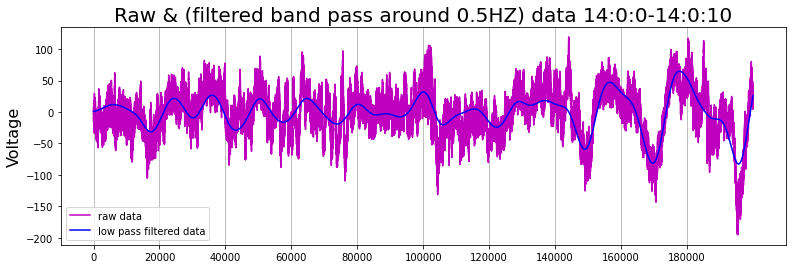

0.0001


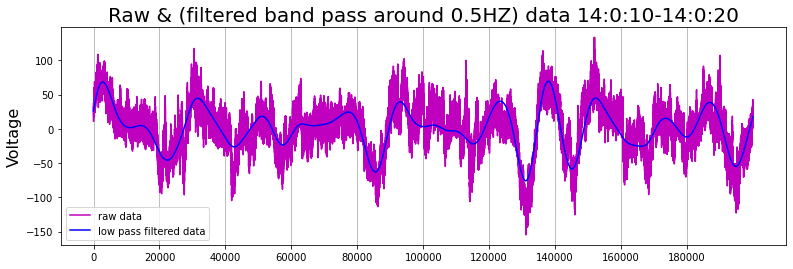

0.0001


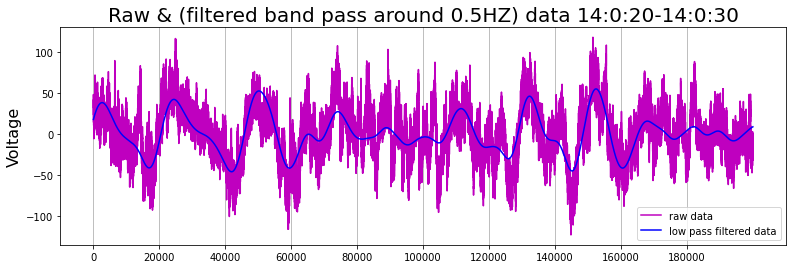

0.0001


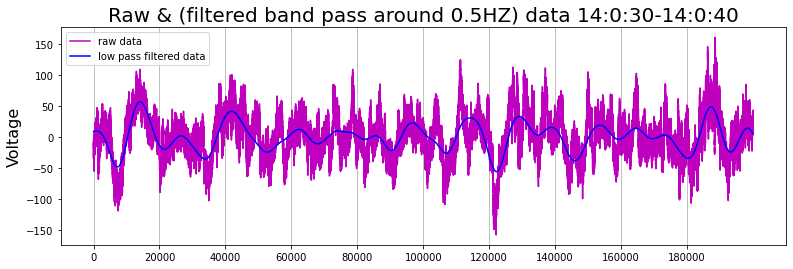

0.0001


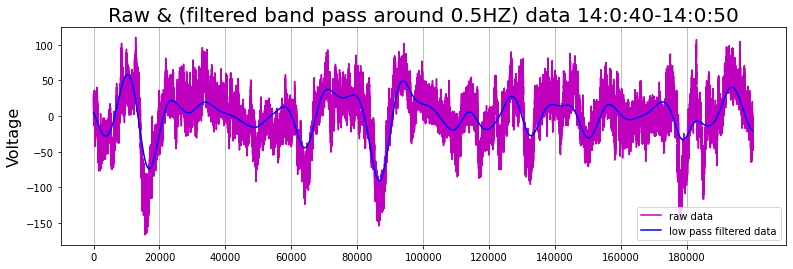

0.0001


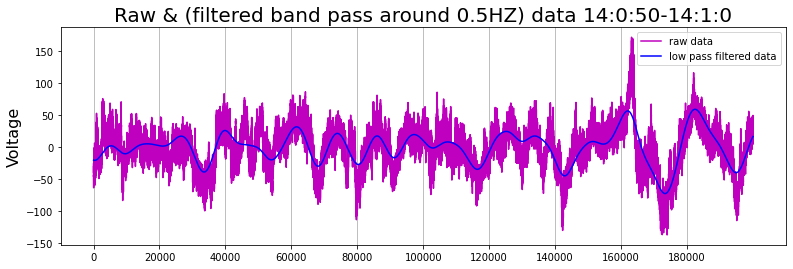

0.0001


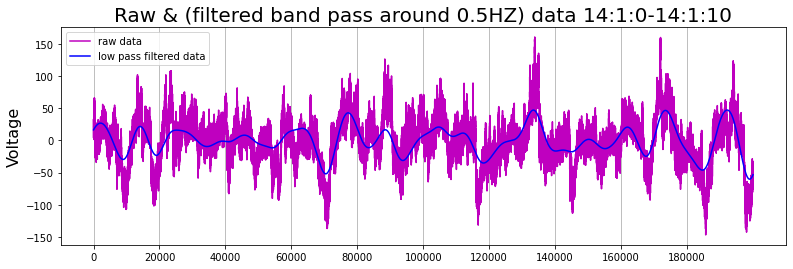

0.0001


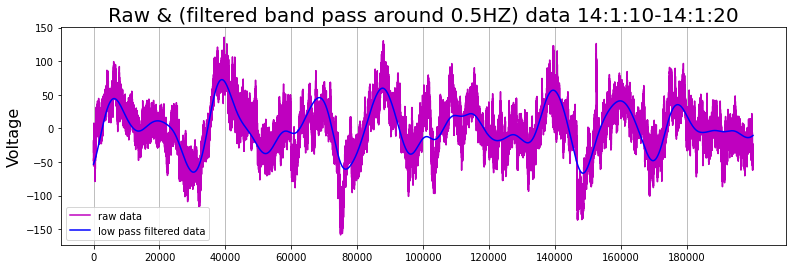

0.0001


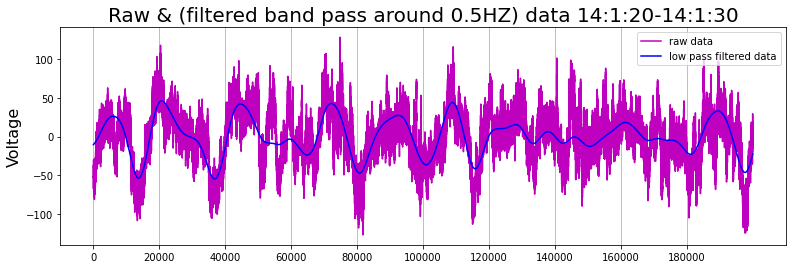

0.0001


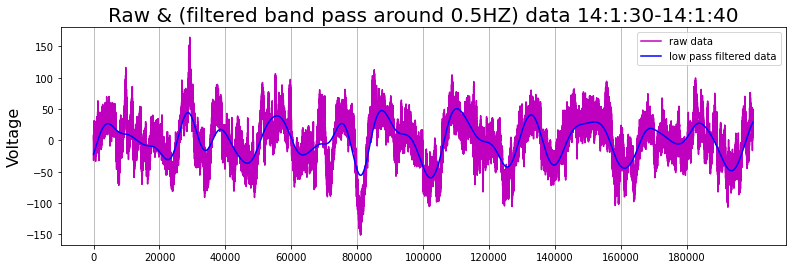

0.0001


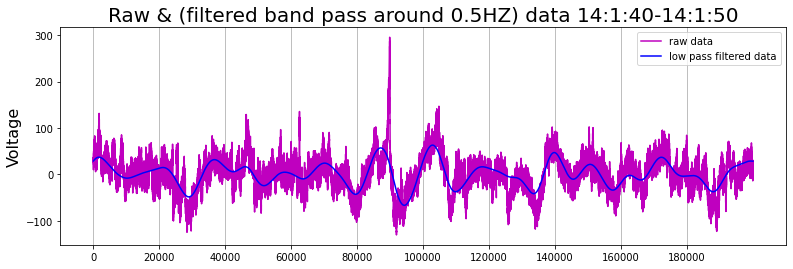

0.0001


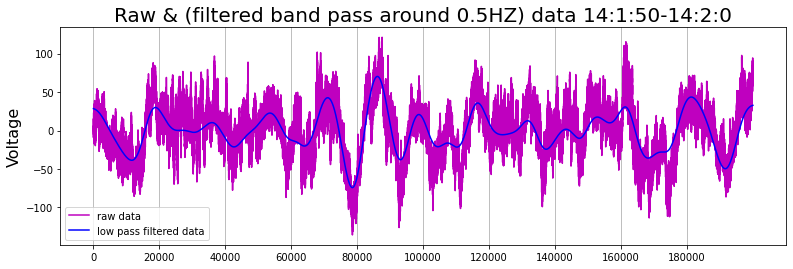

0.0001


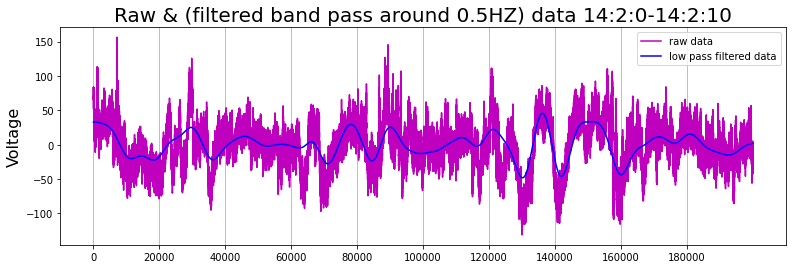

0.0001


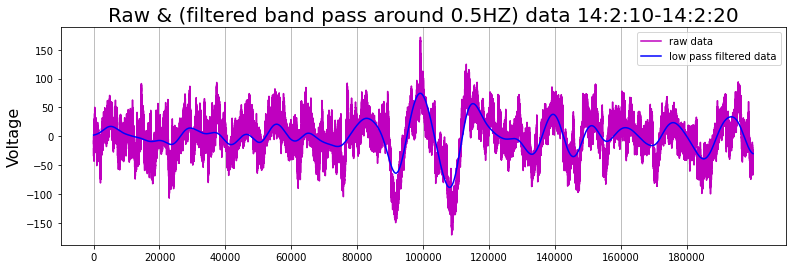

0.0001


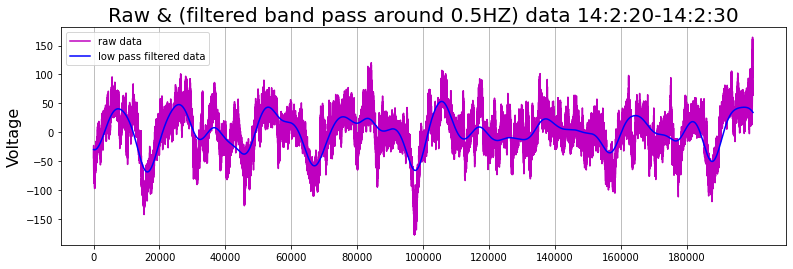

0.0001


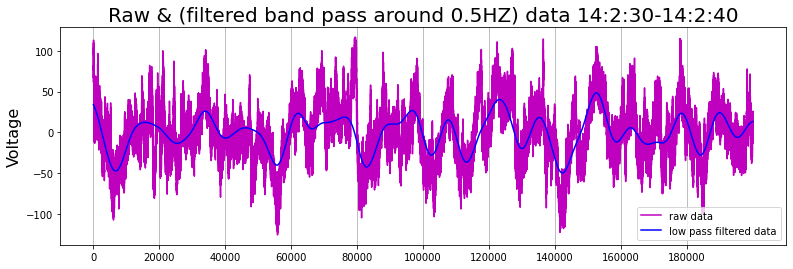

0.0001


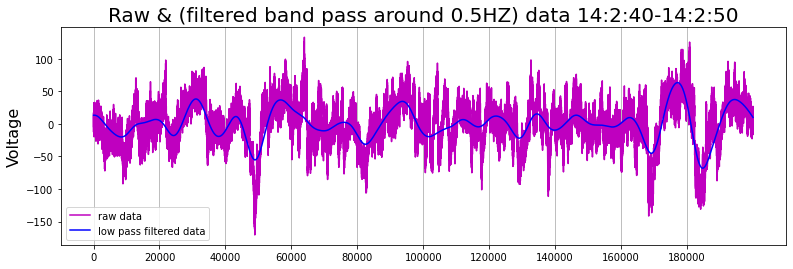

0.0001


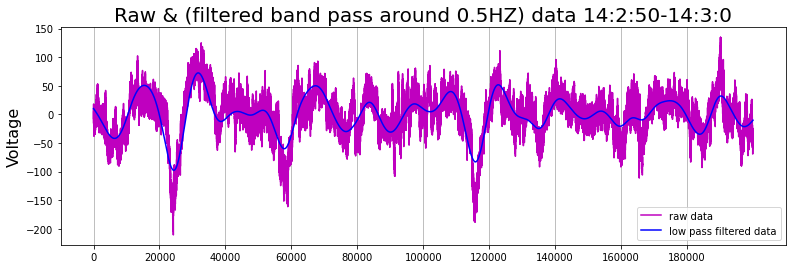

0.0001


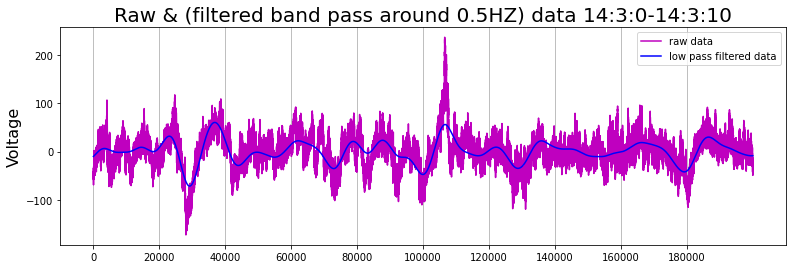

0.0001


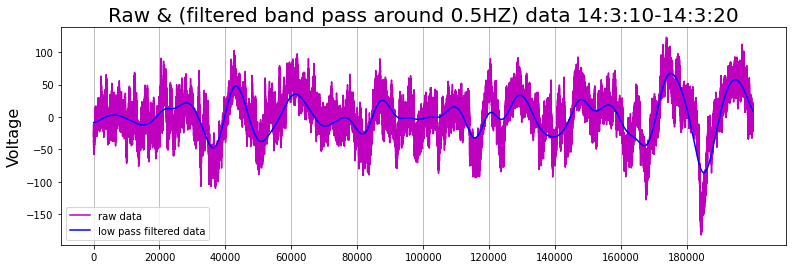

0.0001


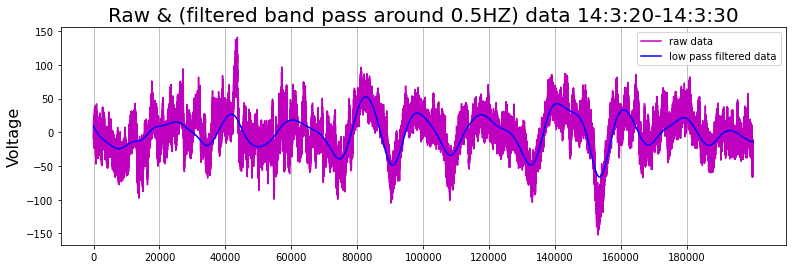

0.0001


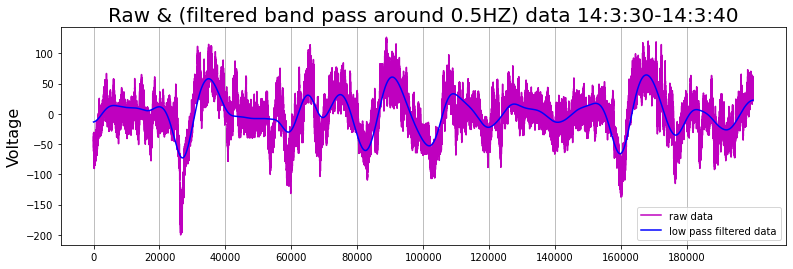

0.0001


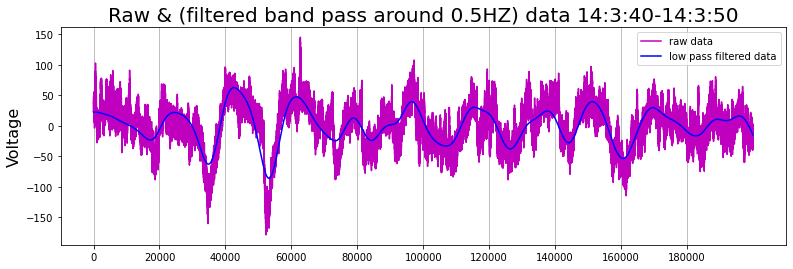

0.0001


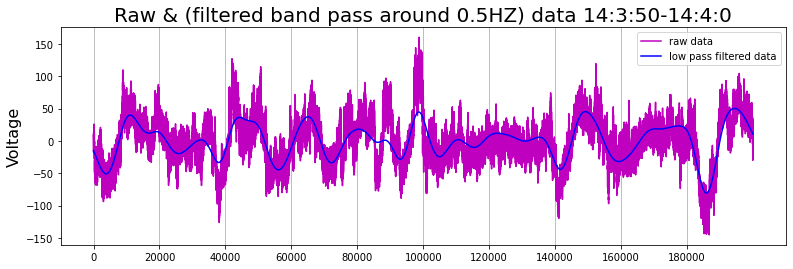

0.0001


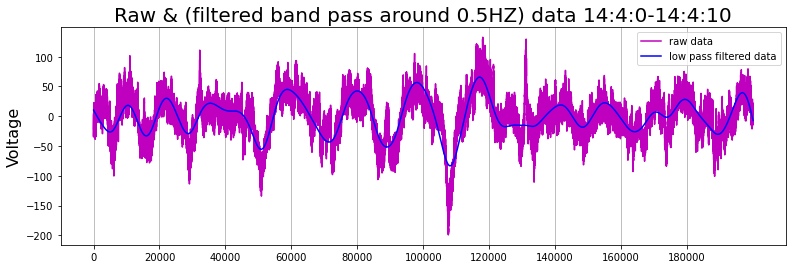

0.0001


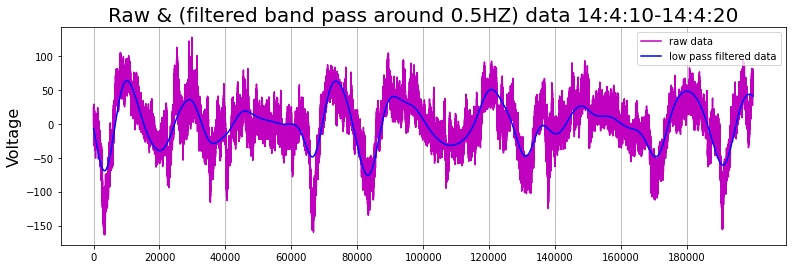

0.0001


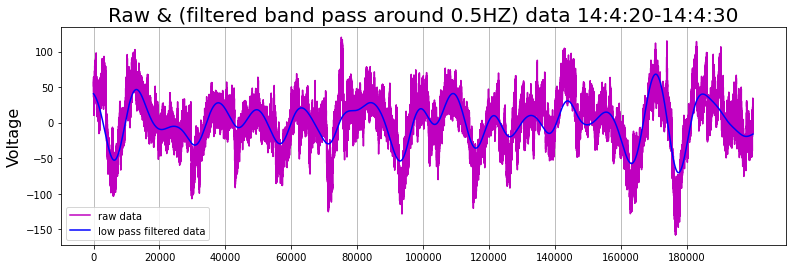

0.0001


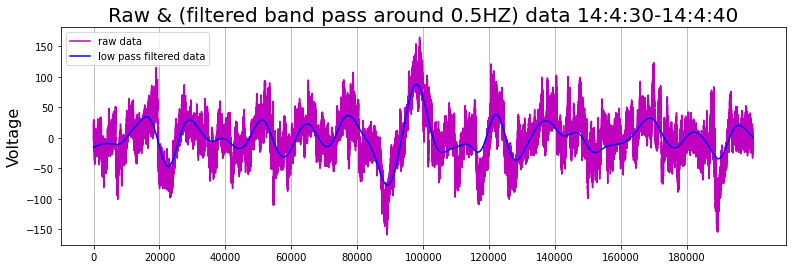

0.0001


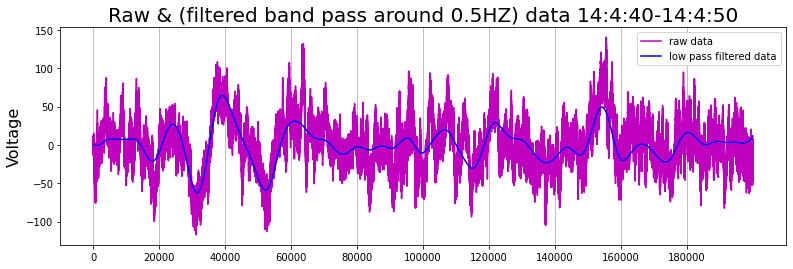

0.0001


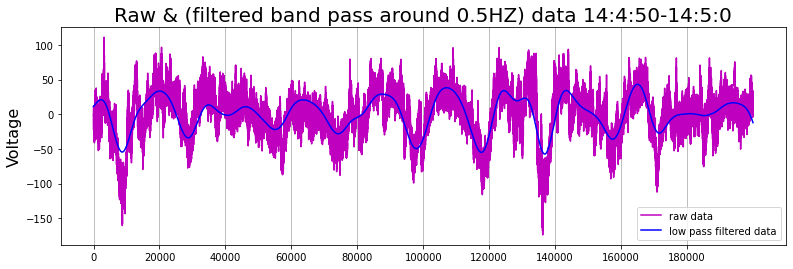

0.0001


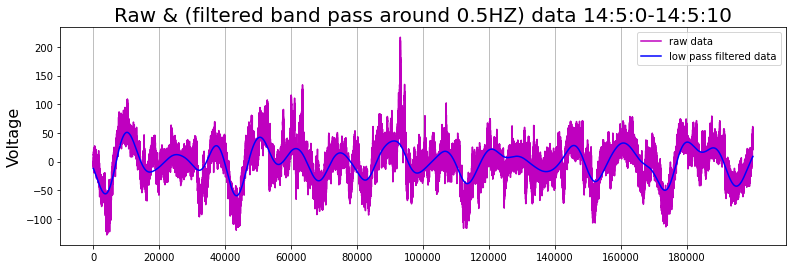

0.0001


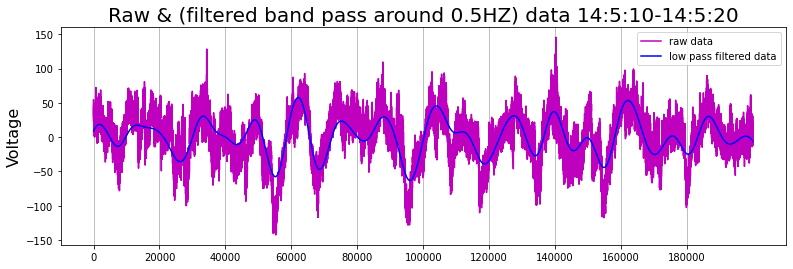

0.0001


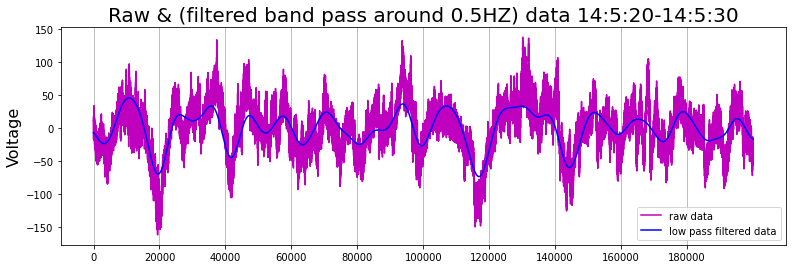

0.0001


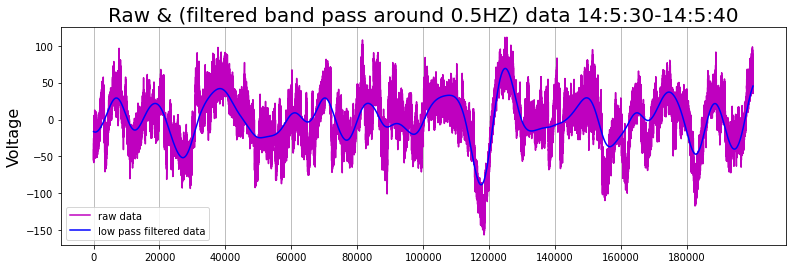

0.0001


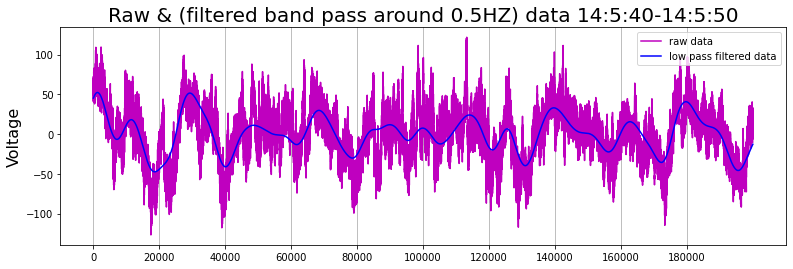

0.0001


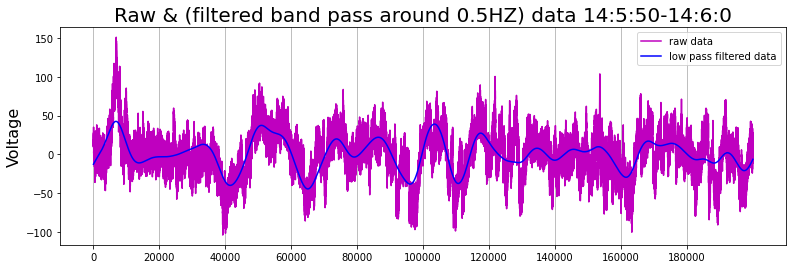

0.0001


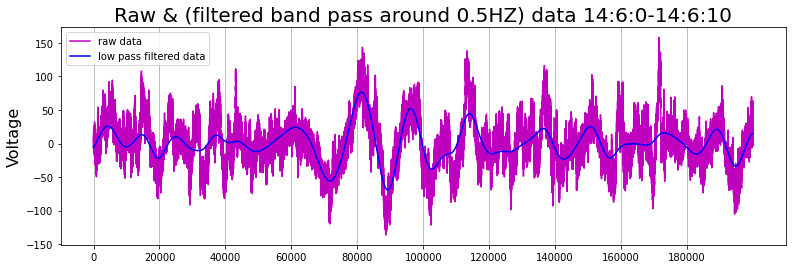

0.0001


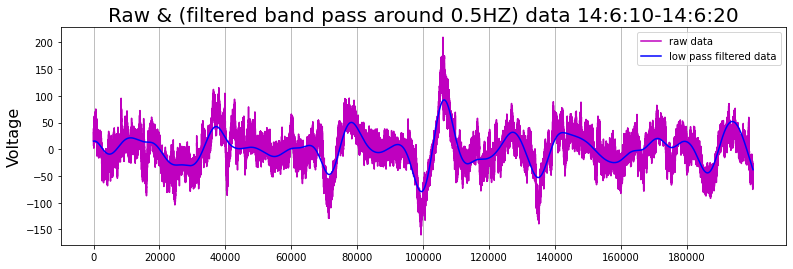

0.0001


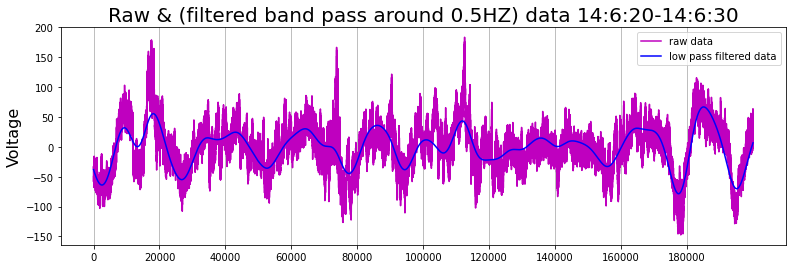

0.0001


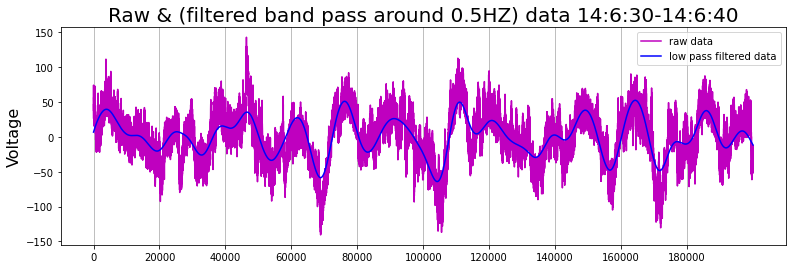

0.0001


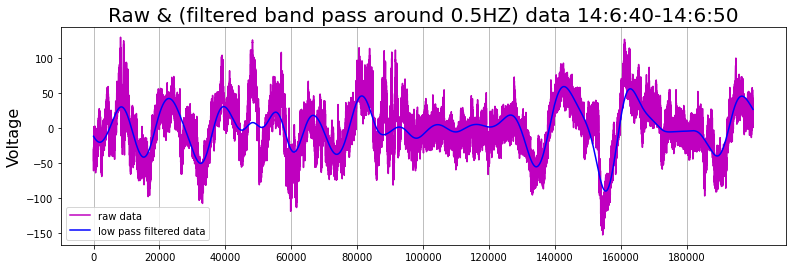

0.0001


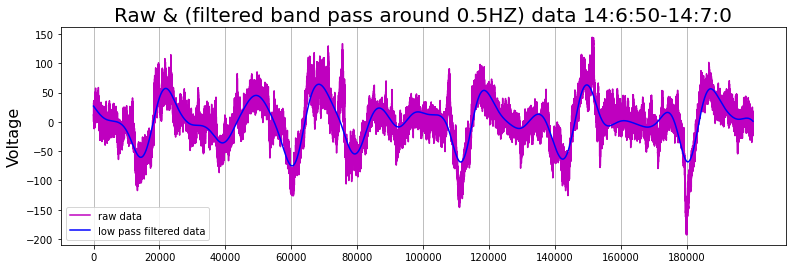

0.0001


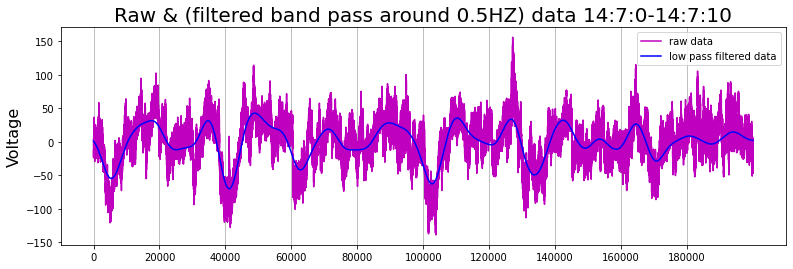

0.0001


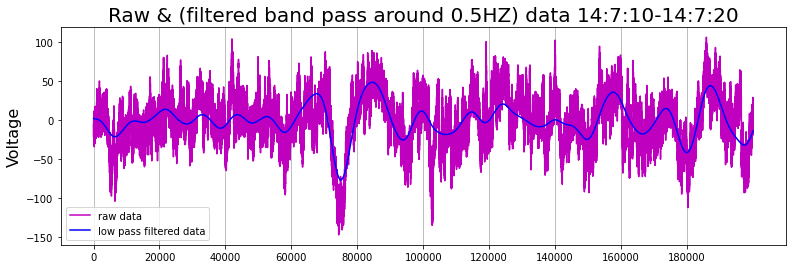

0.0001


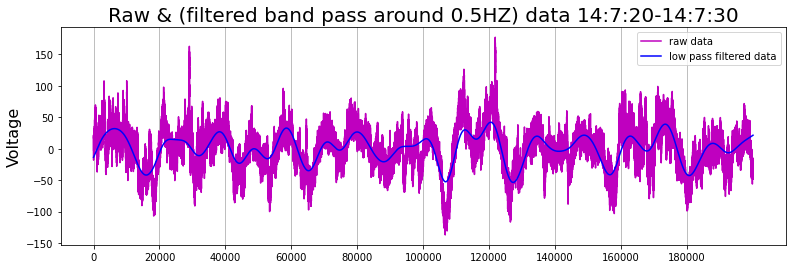

0.0001


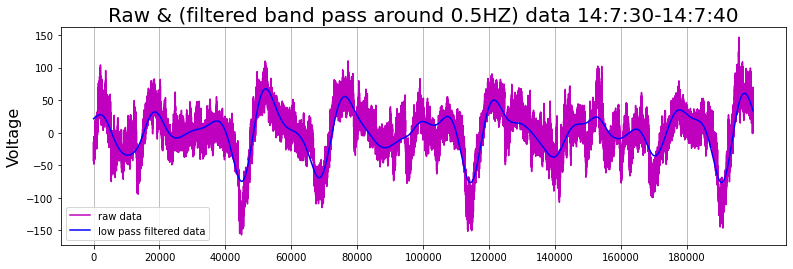

0.0001


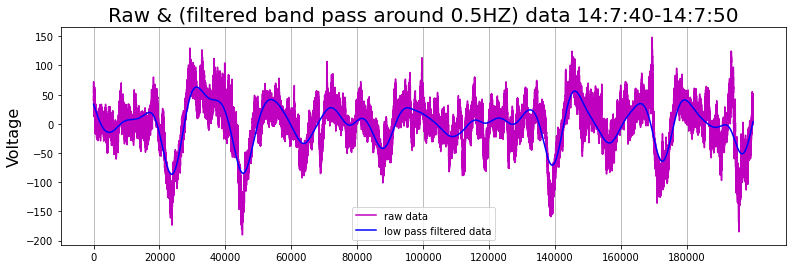

0.0001


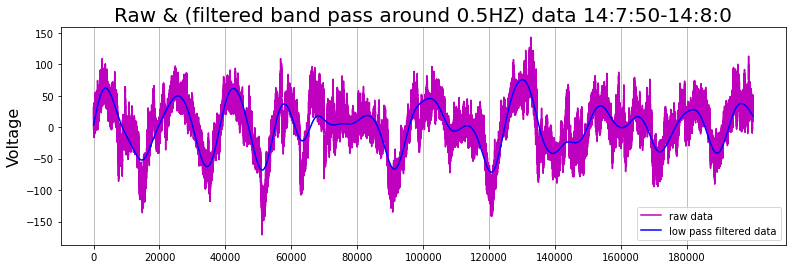

0.0001


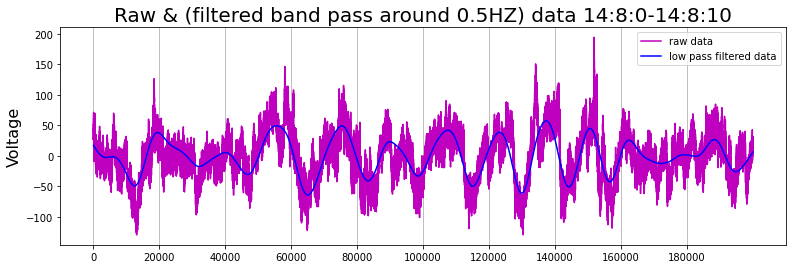

0.0001


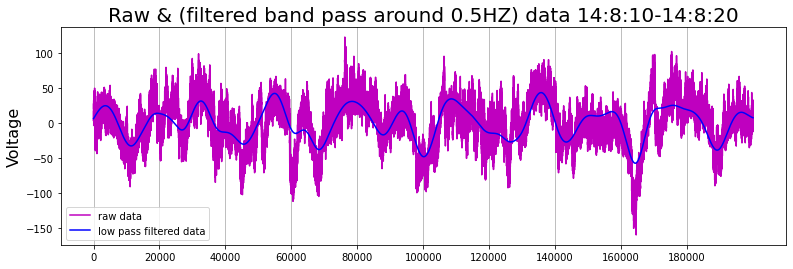

0.0001


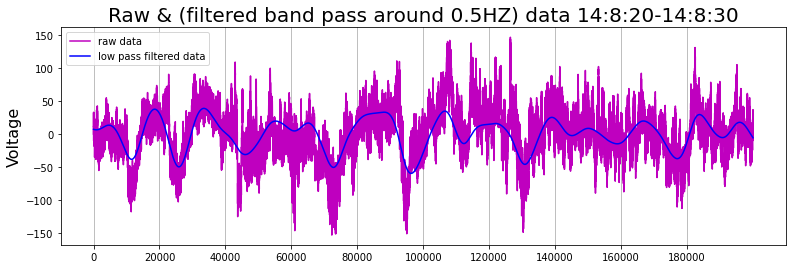

0.0001


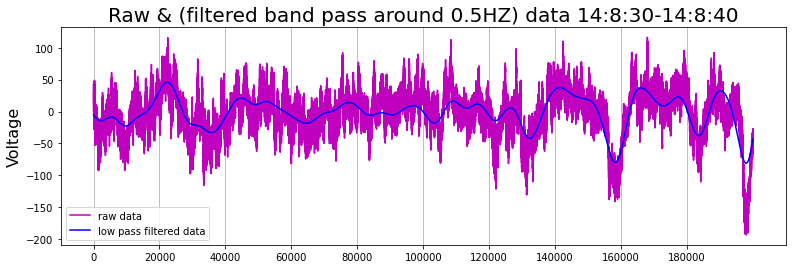

0.0001


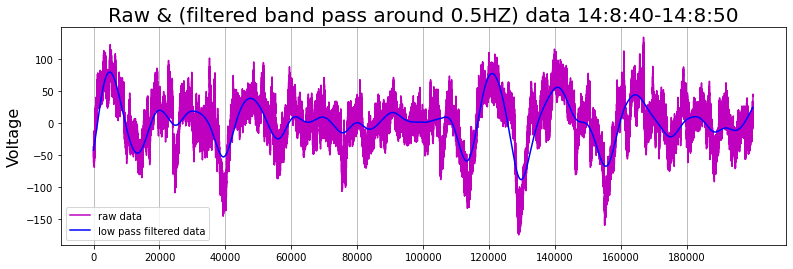

0.0001


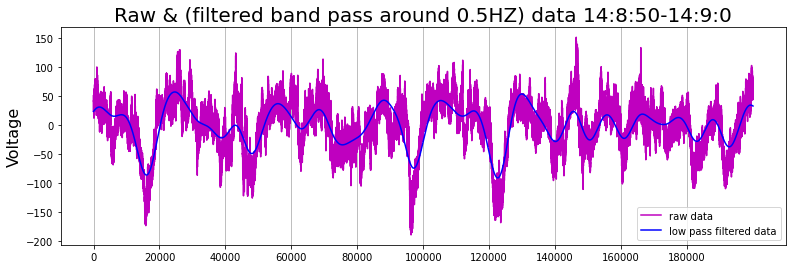

0.0001


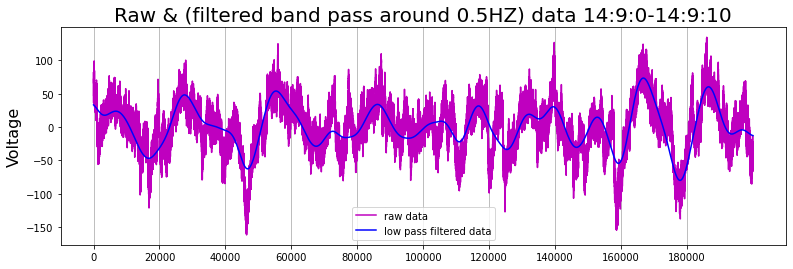

0.0001


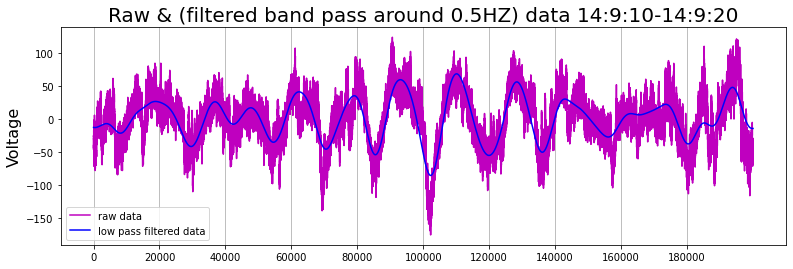

0.0001


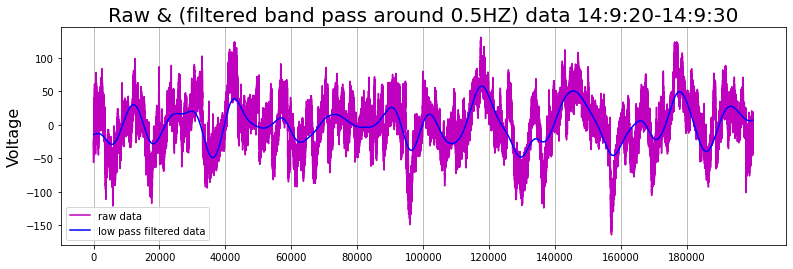

0.0001


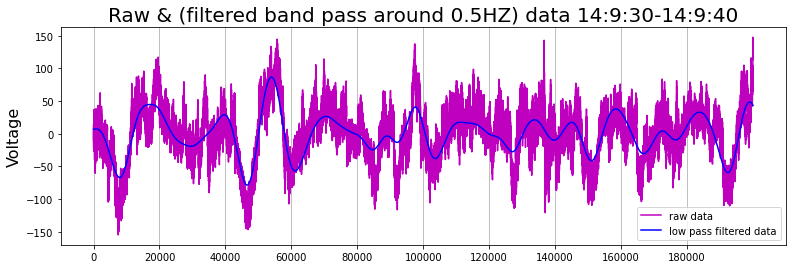

0.0001


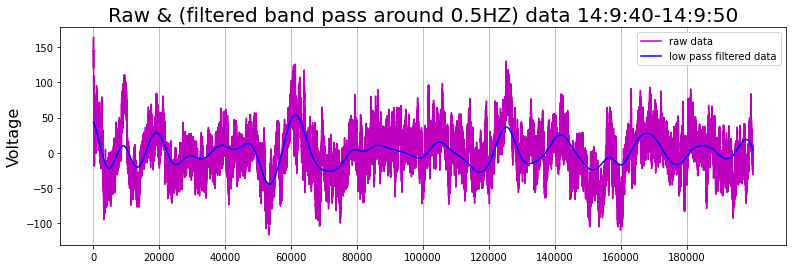

0.0001


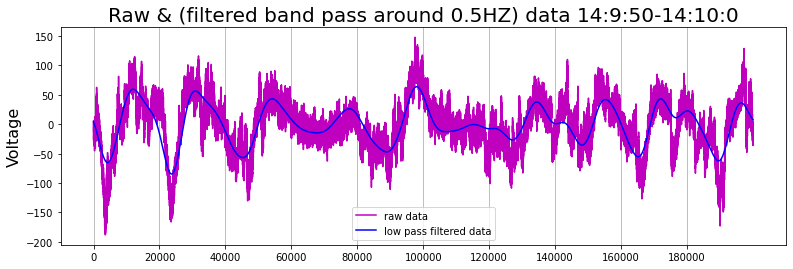

0.0001


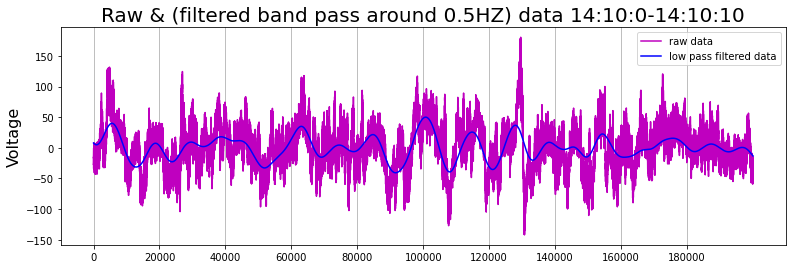

0.0001


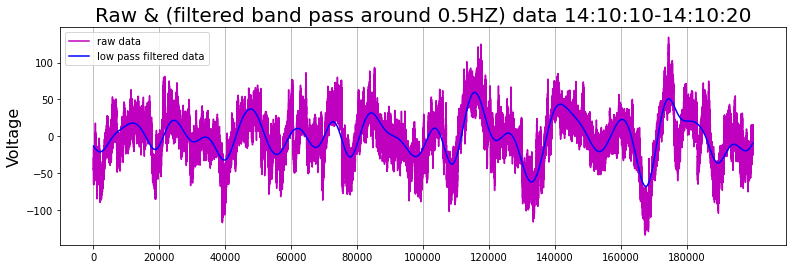

0.0001


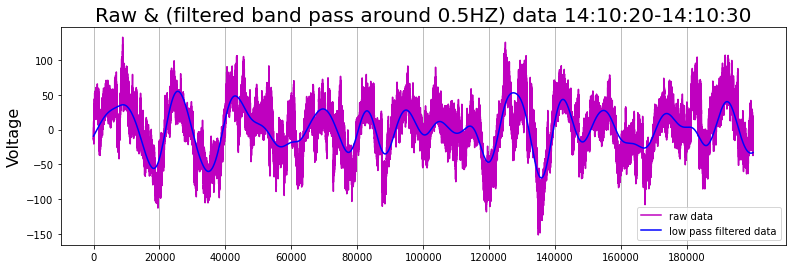

0.0001


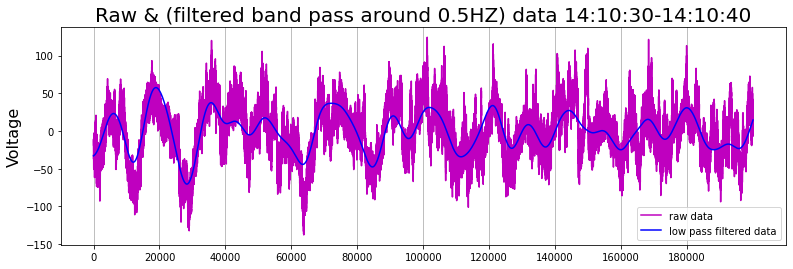

0.0001


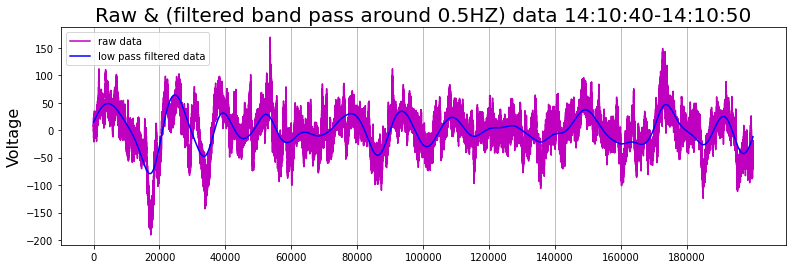

0.0001


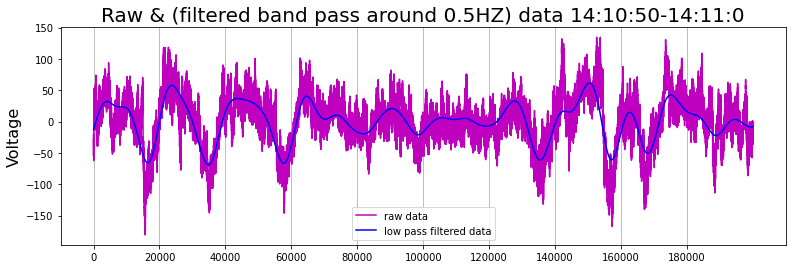

0.0001


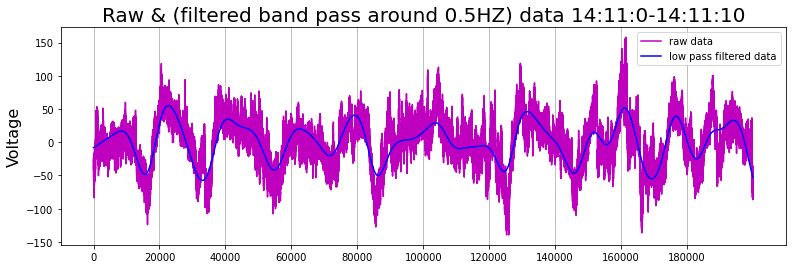

0.0001


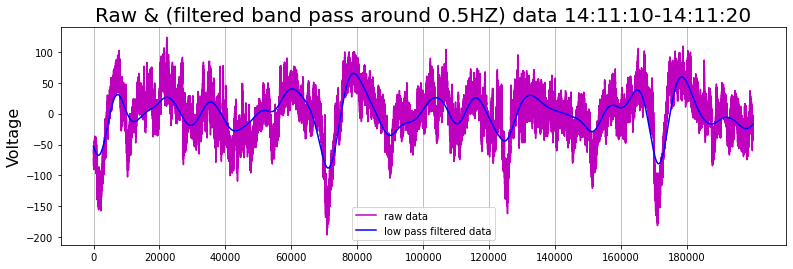

0.0001


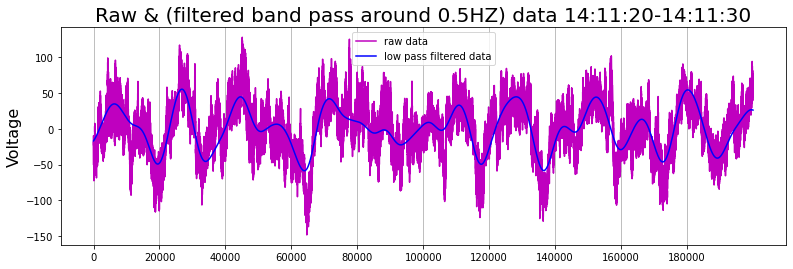

0.0001


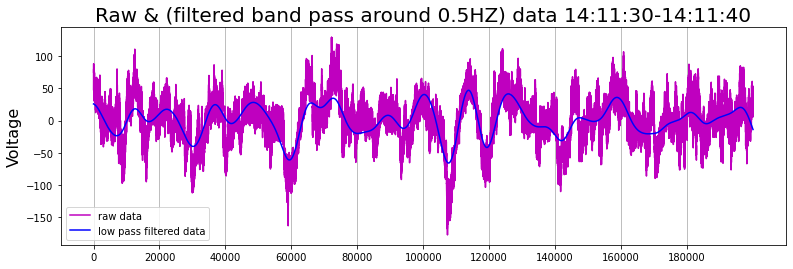

0.0001


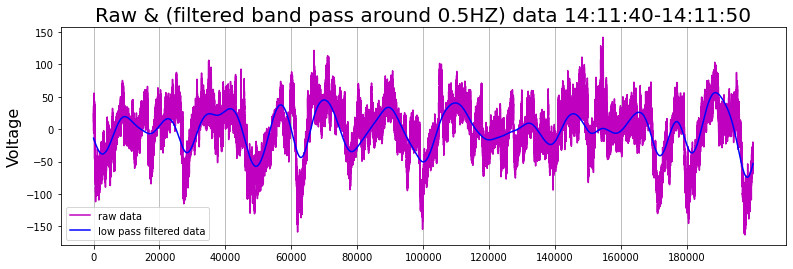

0.0001


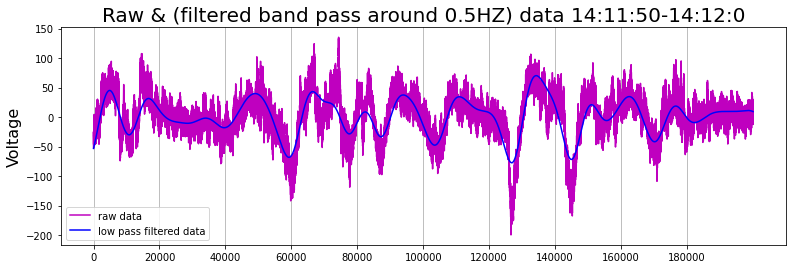

0.0001


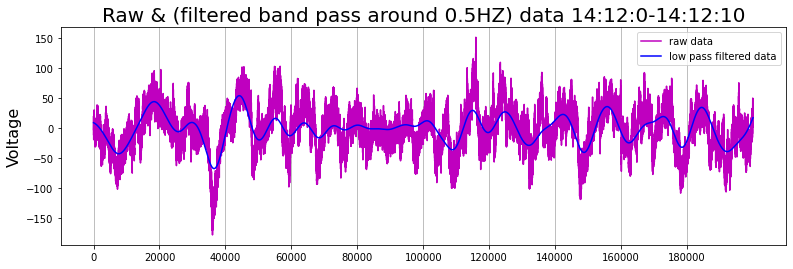

0.0001


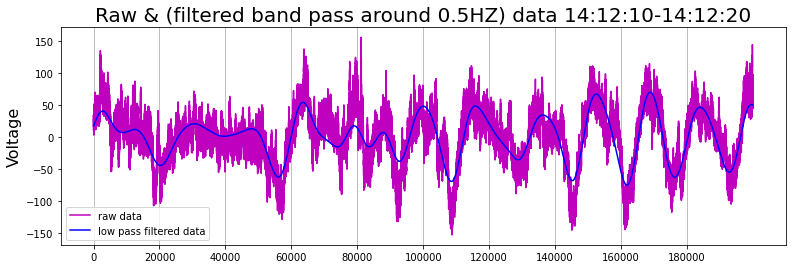

0.0001


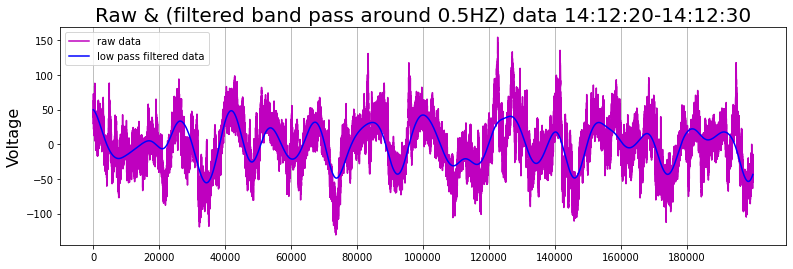

0.0001


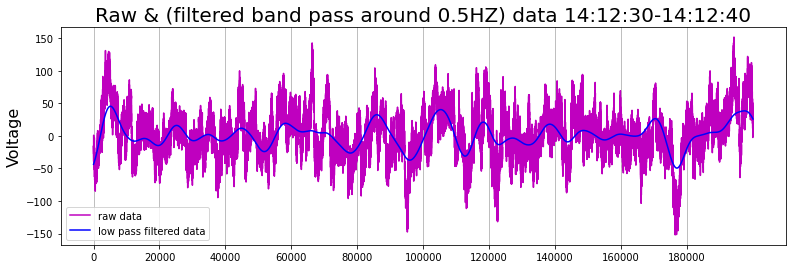

0.0001


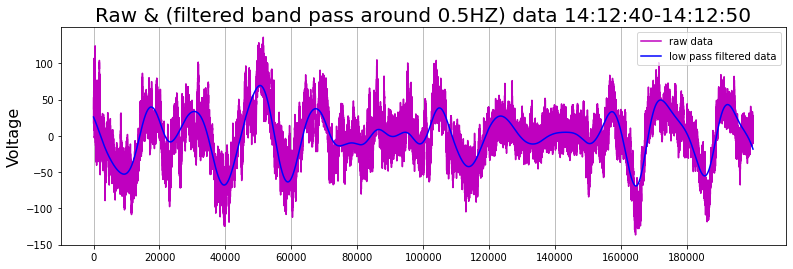

0.0001


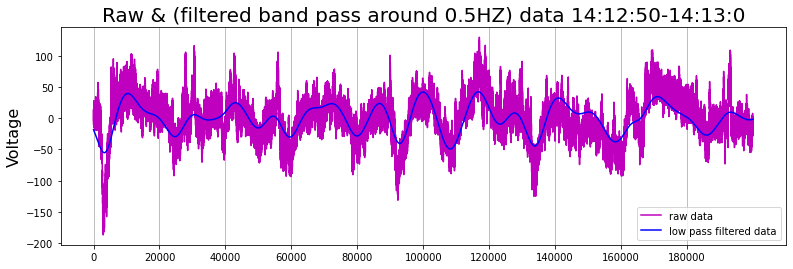

0.0001


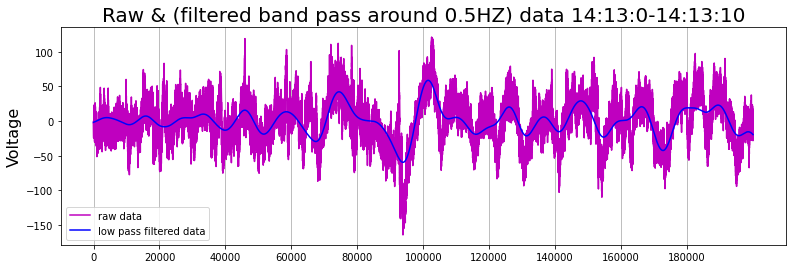

0.0001


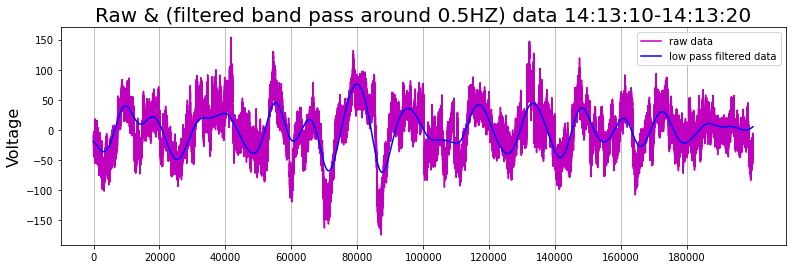

0.0001


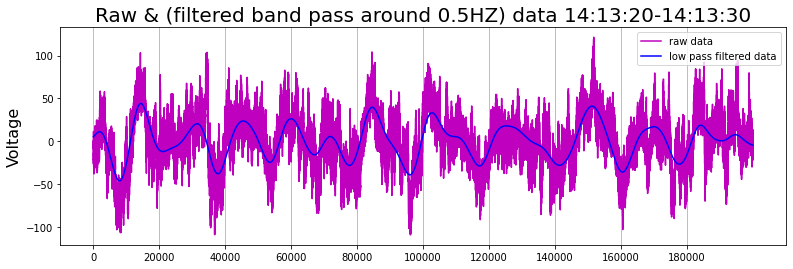

0.0001


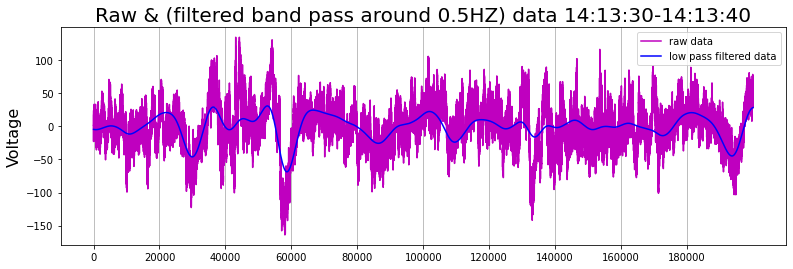

0.0001


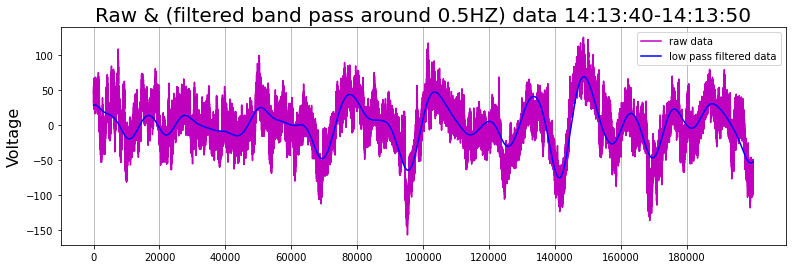

0.0001


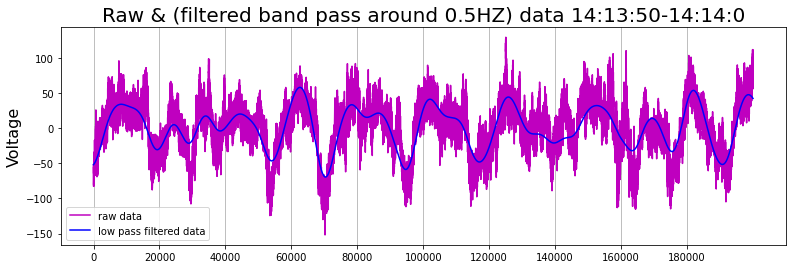

0.0001


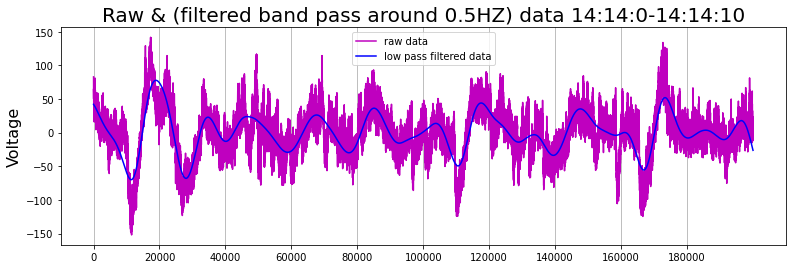

0.0001


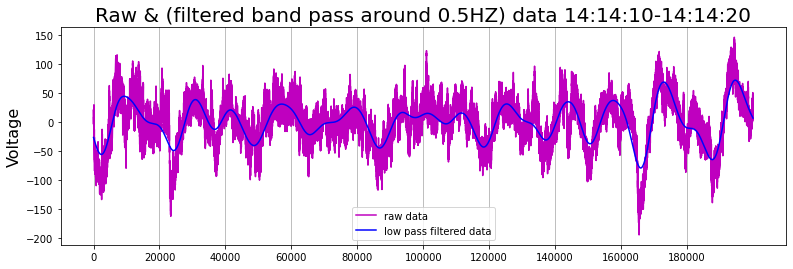

0.0001


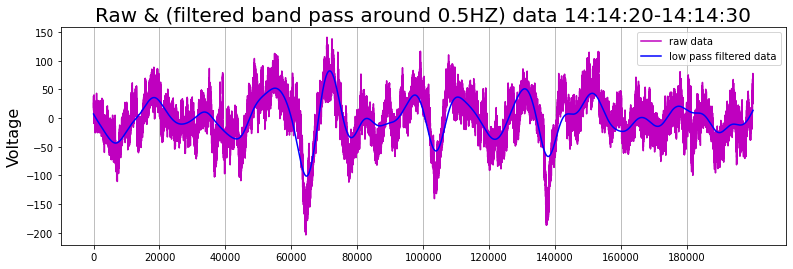

0.0001


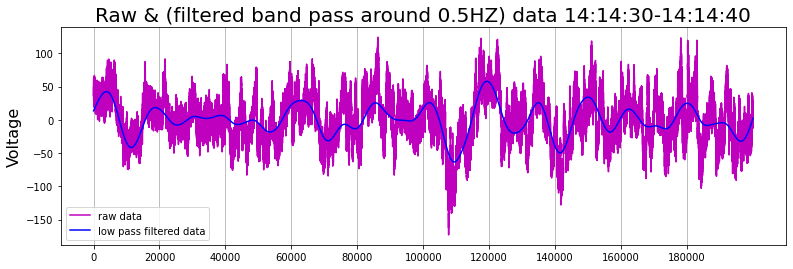

0.0001


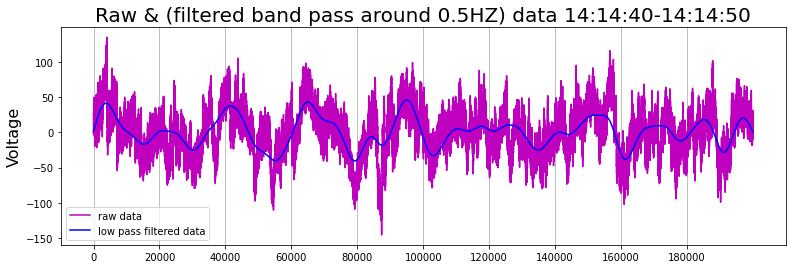

0.0001


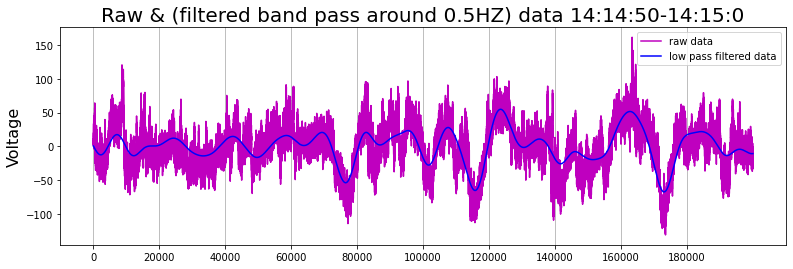

0.0001


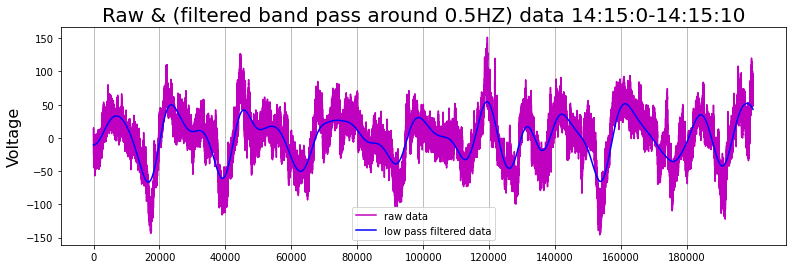

0.0001


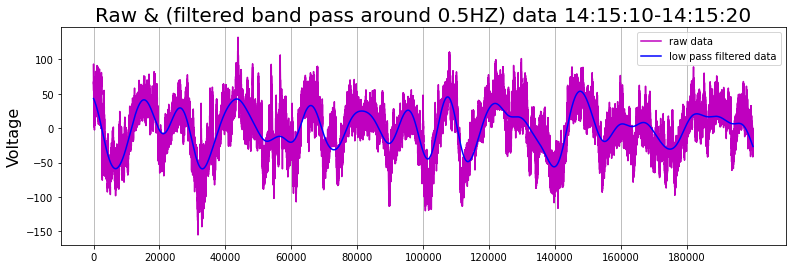

0.0001


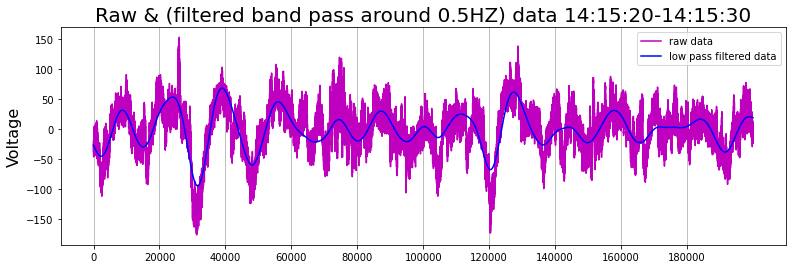

0.0001


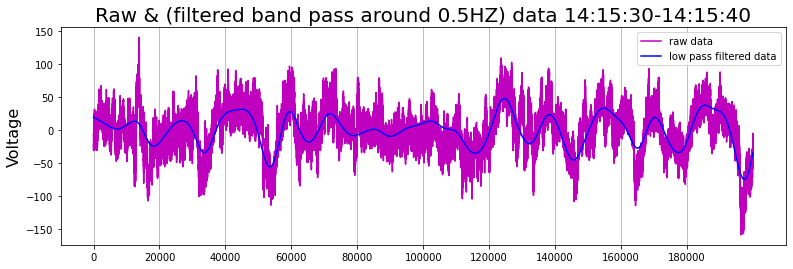

0.0001


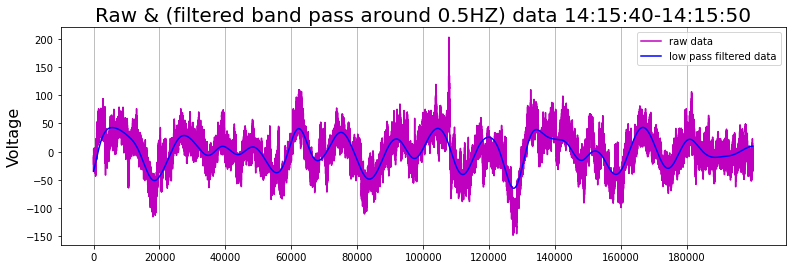

0.0001


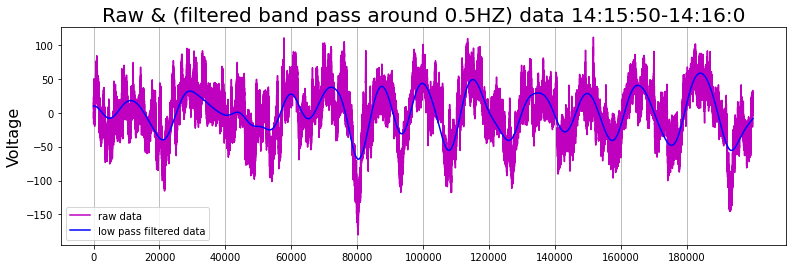

0.0001


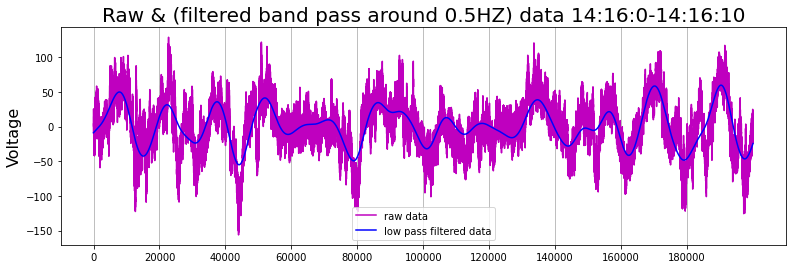

0.0001


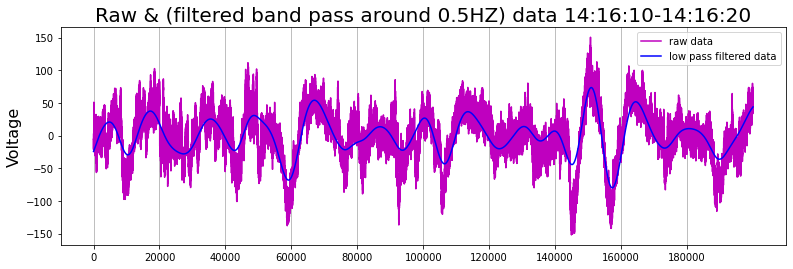

0.0001


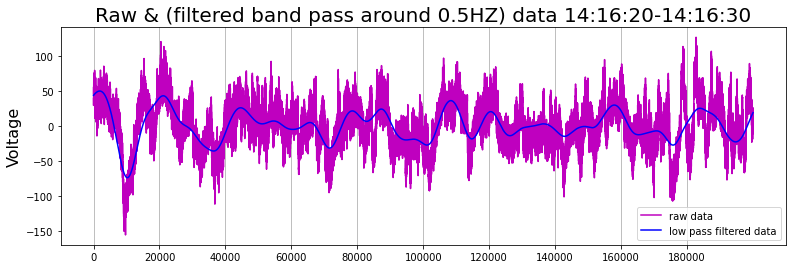

0.0001


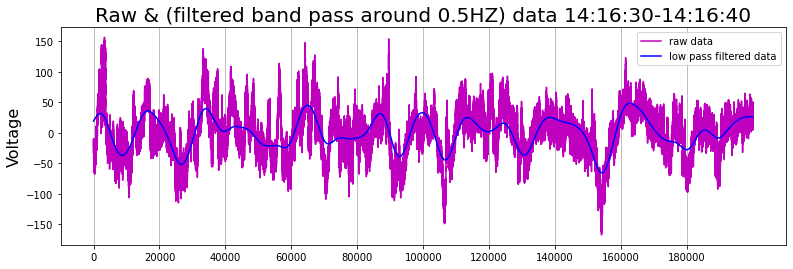

0.0001


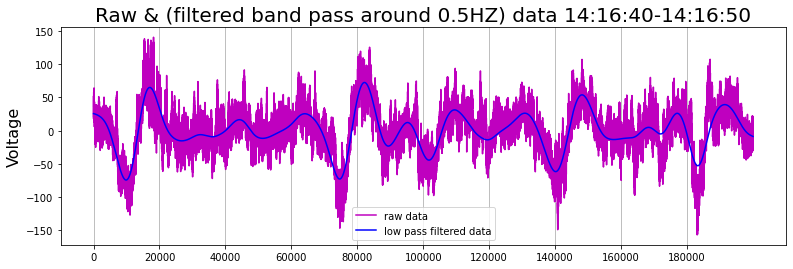

0.0001


KeyboardInterrupt: 

Error in callback <function flush_figures at 0x7f7742f16f80> (for post_execute):


KeyboardInterrupt: 

In [21]:
for i in range(0, 3600, 10):
    fig, ax = plt.subplots(figsize=(13,4))
    plt.plot(data14[second_to_sample(i):second_to_sample(i+10)], 'm-', label='raw data')
    bpf = band_pass_filter(data14, T=600, around=0.5)
    plt.plot(lpf[second_to_sample(i):second_to_sample(i+10)], 'b-', label='low pass filtered data')
    
    """
    F = 1
    T = 10
    Fs = 20000
    Ts = 1./Fs
    N = int(T/Ts)

#     t = np.linspace(0, T, N)
    signal = np.sin(2*np.pi*F*t + 600)

    plt.plot(100*signal, 'g-', label='sine wave of 1HZ')
    """
    
    plt.legend(loc='best')
    ax.set_xticks(np.arange(0, 200000, 20000), minor=False)
    ax.xaxis.grid(True, which='major')
    plt.title('Raw & (filtered band pass around 0.5HZ) data 14:%d:%d-14:%d:%d' %(i/60, i%60, (i+10)/60, (i+10)%60), fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.show()

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


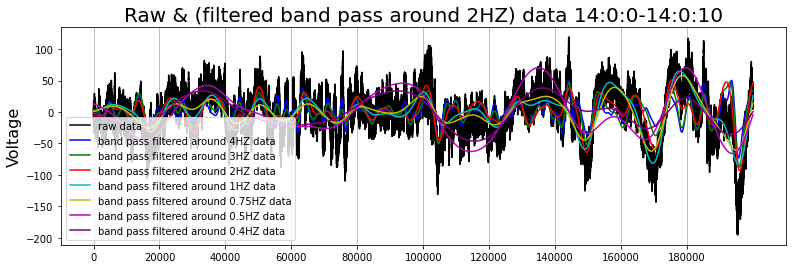

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


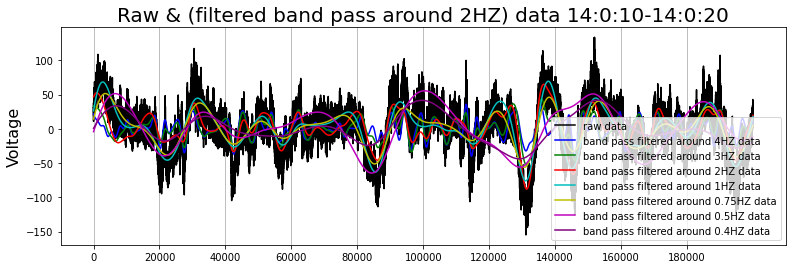

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


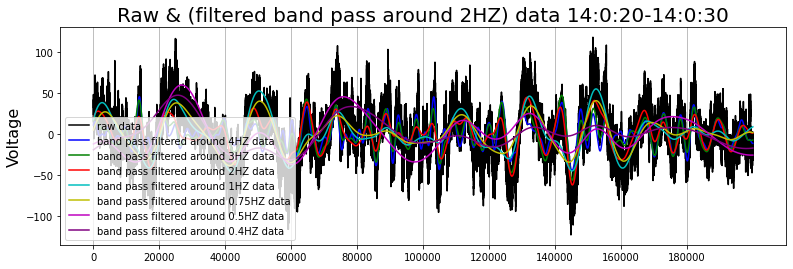

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


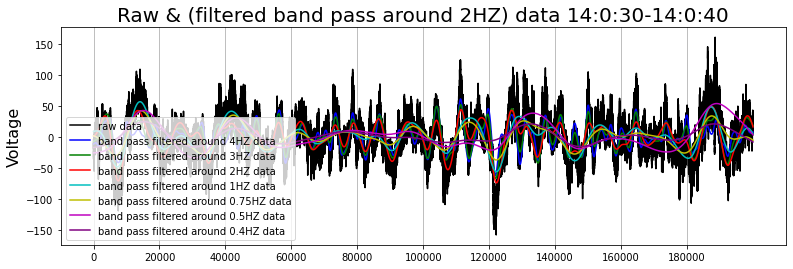

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


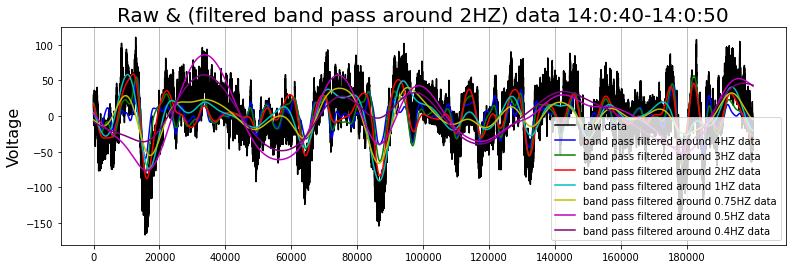

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


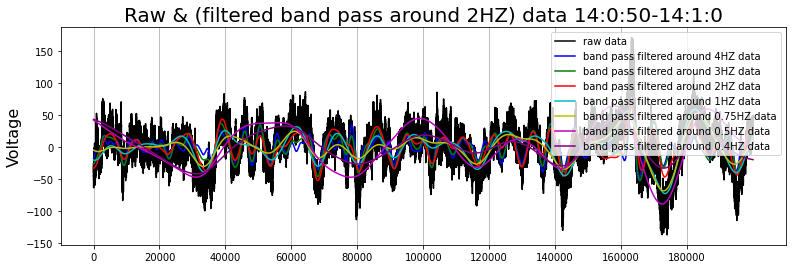

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


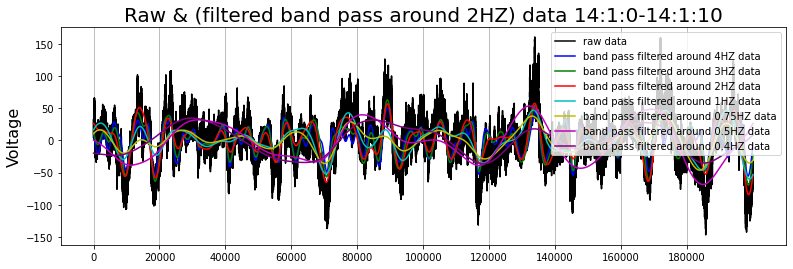

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


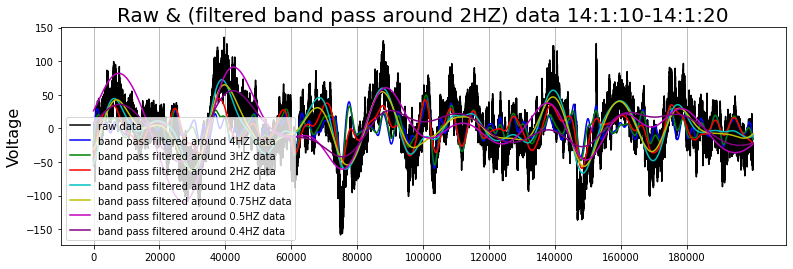

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


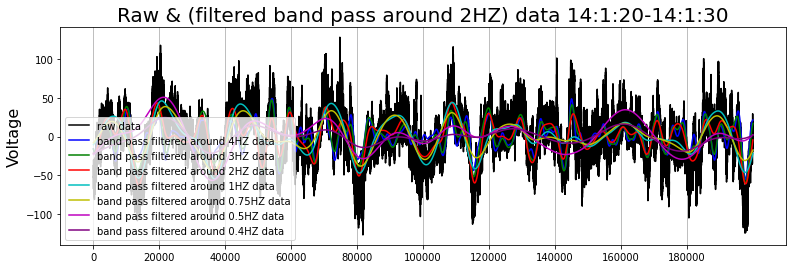

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


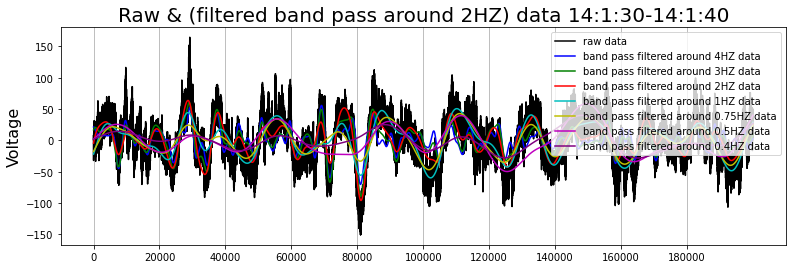

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


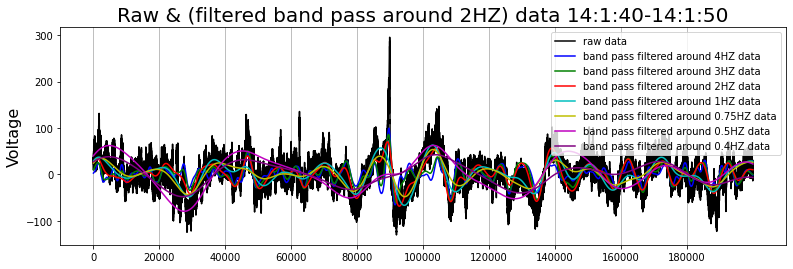

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


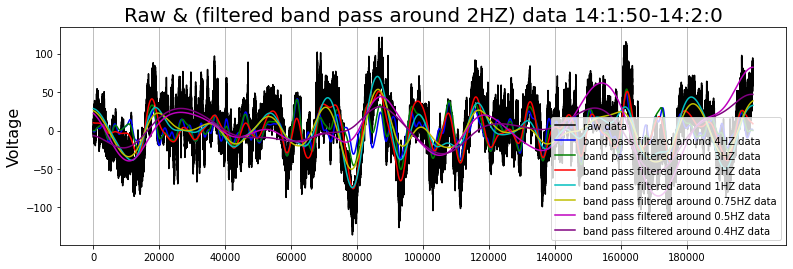

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


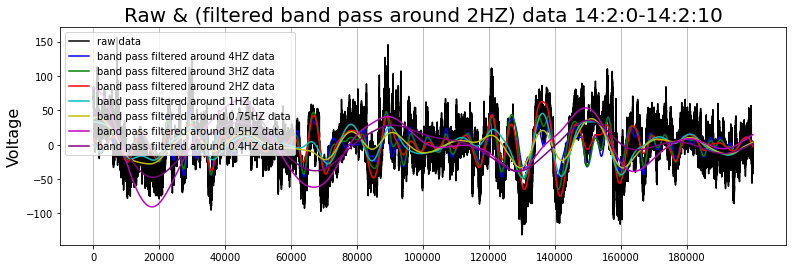

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


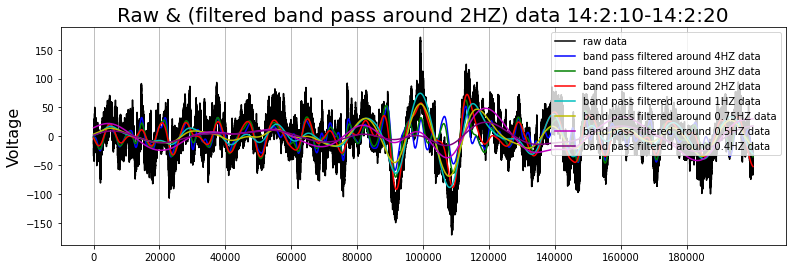

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


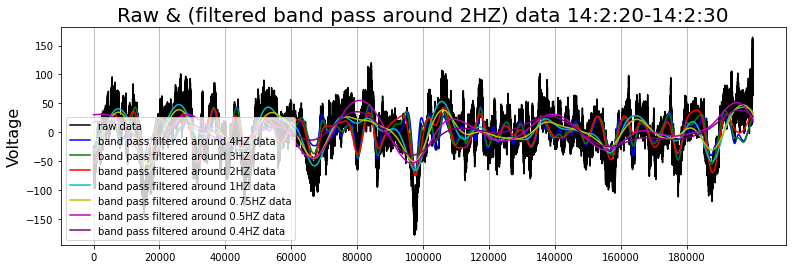

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


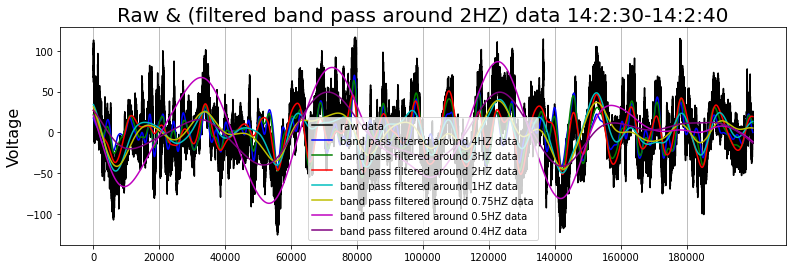

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


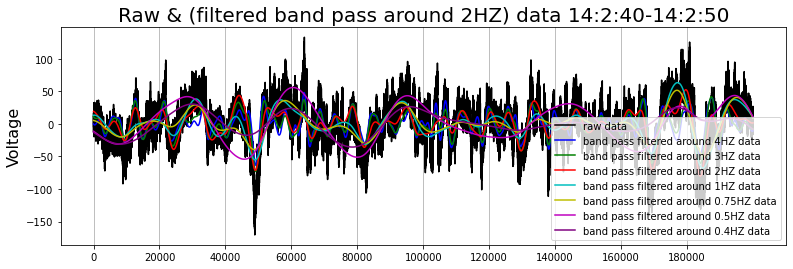

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


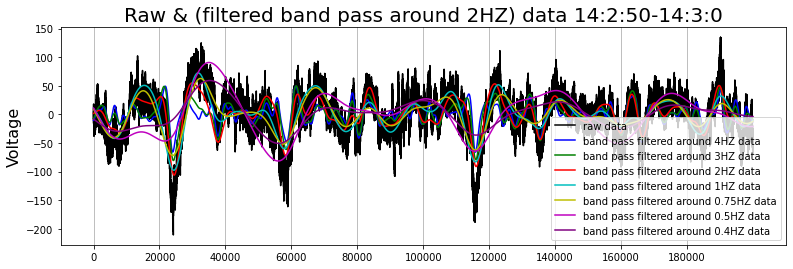

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


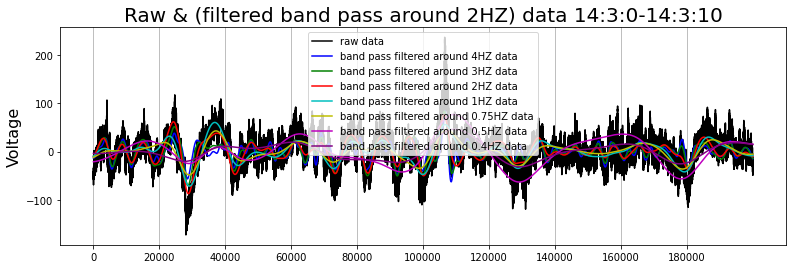

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


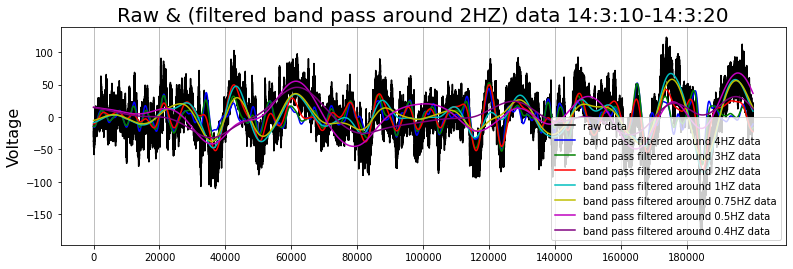

0.0008
0.0006
0.0004
0.0002
0.00015
0.0001
8e-05
[-5.77329119 -5.77400782 -5.77472455 -5.77544137 -5.77615829 -5.77687529
 -5.77759239 -5.77830958 -5.77902686 -5.77974424]


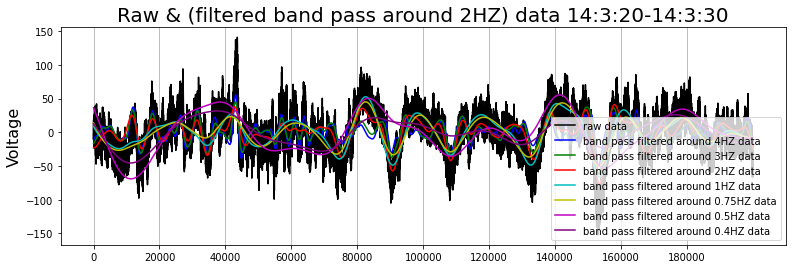

0.0008


MemoryError: Unable to allocate 549. MiB for an array with shape (72000030,) and data type float64

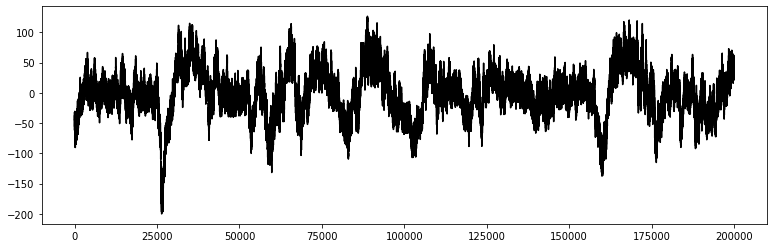

In [46]:
for i in range(0, 3600, 60):
    fig, ax = plt.subplots(figsize=(13,4))
    plt.plot(data14[second_to_sample(i):second_to_sample(i+60)], 'k-', label='raw data')
    bpf4 = band_pass_filter(data14, T=600, around=4)
    bpf3 = band_pass_filter(data14, T=600, around=3)
    bpf2 = band_pass_filter(data14, T=600, around=2)
    bpf1 = band_pass_filter(data14, T=600, around=1)
    bpf075 = band_pass_filter(data14, T=600, around=0.75)
    bpf05 = band_pass_filter(data14, T=600, around=0.5)
    bpf04 = band_pass_filter(data14, T=600, around=0.4)
    print(bpf04[:10])
    plt.plot(bpf4[second_to_sample(i):second_to_sample(i+60)], 'b-', label='band pass filtered around 4HZ data')
    plt.plot(bpf3[second_to_sample(i):second_to_sample(i+60)], 'g-', label='band pass filtered around 3HZ data')
    plt.plot(bpf2[second_to_sample(i):second_to_sample(i+60)], 'r-', label='band pass filtered around 2HZ data')
    plt.plot(bpf1[second_to_sample(i):second_to_sample(i+60)], 'c-', label='band pass filtered around 1HZ data')
    plt.plot(bpf075[second_to_sample(i):second_to_sample(i+60)], 'y-', label='band pass filtered around 0.75HZ data')
    plt.plot(bpf05[second_to_sample(i):second_to_sample(i+60)], 'm-', label='band pass filtered around 0.5HZ data')
    plt.plot(bpf04[second_to_sample(i):second_to_sample(i+60)], 'purple', label='band pass filtered around 0.4HZ data')
    
    """
    F = 1
    T = 10
    Fs = 20000
    Ts = 1./Fs
    N = int(T/Ts)

#     t = np.linspace(0, T, N)
    signal = np.sin(2*np.pi*F*t + 600)

    plt.plot(100*signal, 'g-', label='sine wave of 1HZ')
    """
    
    plt.legend(loc='best')
    ax.set_xticks(np.arange(0, 200000, 20000), minor=False)
    ax.xaxis.grid(True, which='major')
    plt.title('Raw & (filtered band pass around 2HZ) data 14:%d:%d-14:%d:%d' %(i/60, i%60, (i+60)/60, (i+60)%60), fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.show()

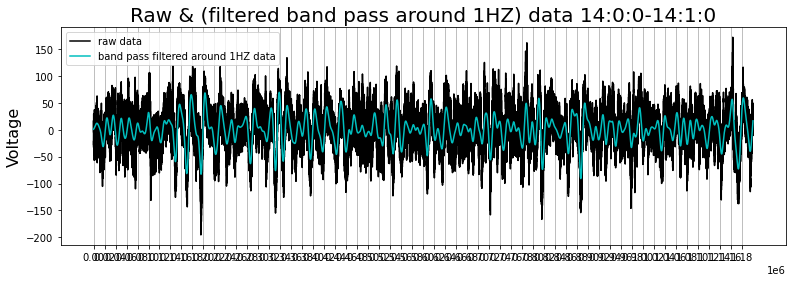

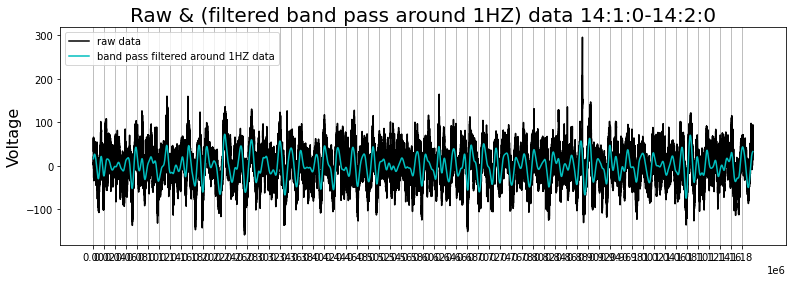

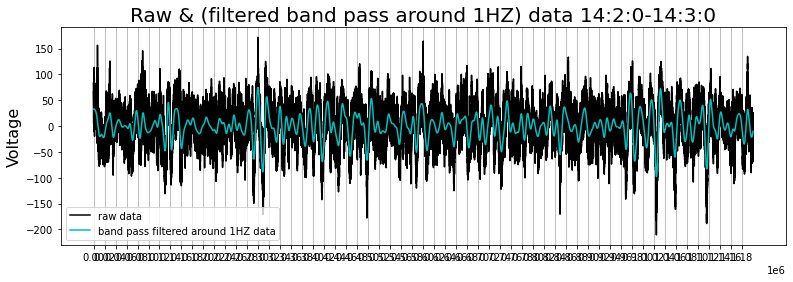

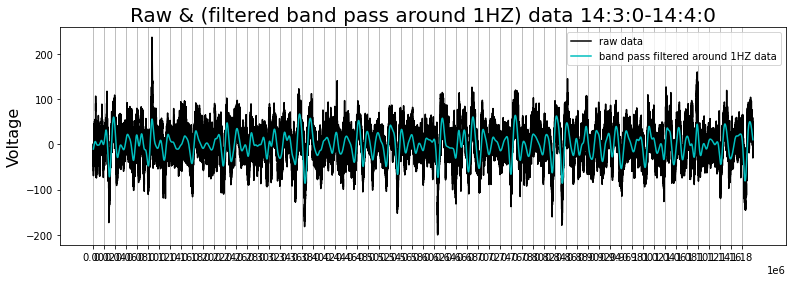

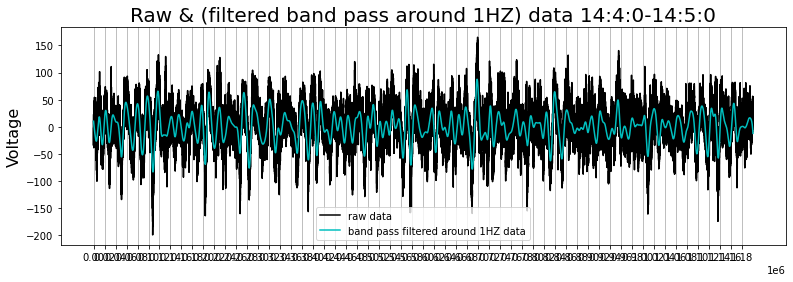

...

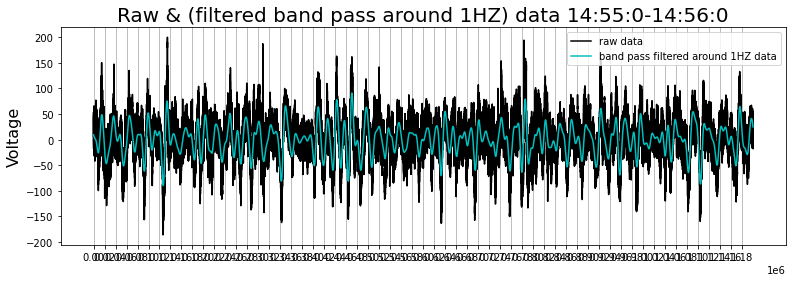

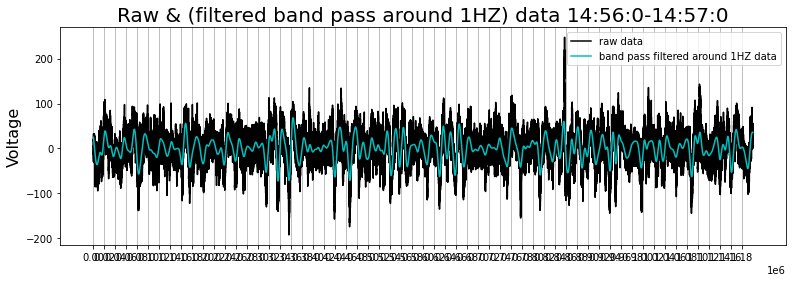

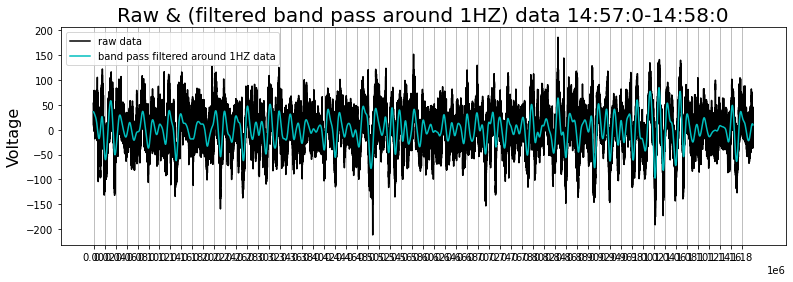

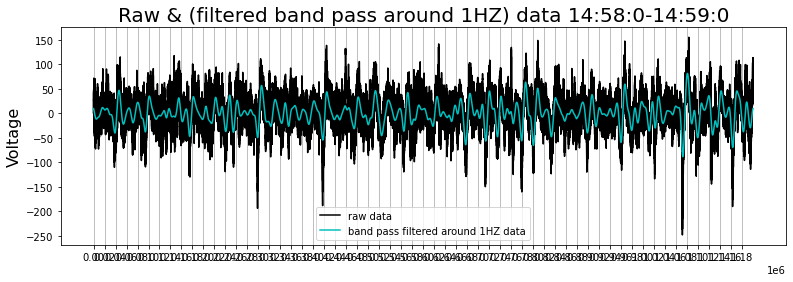

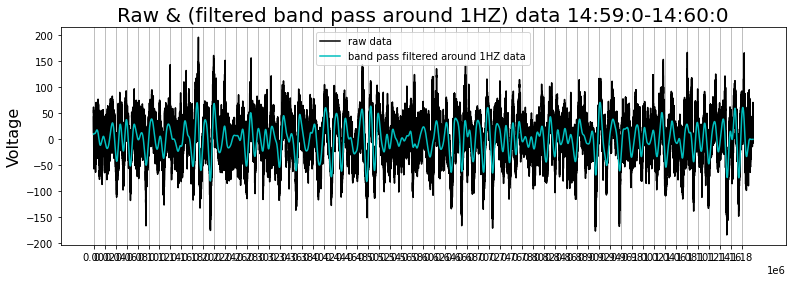

In [17]:
for i in range(0, 3600, 60):
    fig, ax = plt.subplots(figsize=(13,4))
    plt.plot(data14[second_to_sample(i):second_to_sample(i+60)], 'k-', label='raw data')
    bpf4 = band_pass_filter(data14, T=600, around=4)
    bpf3 = band_pass_filter(data14, T=600, around=3)
    bpf2 = band_pass_filter(data14, T=600, around=2)
    bpf1 = band_pass_filter(data14, T=600, around=1)
    bpf075 = band_pass_filter(data14, T=600, around=0.75)
    bpf05 = band_pass_filter(data14, T=600, around=0.5)
    bpf04 = band_pass_filter(data14, T=600, around=0.4)
#     print(bpf04[:10])
#     plt.plot(bpf4[second_to_sample(i):second_to_sample(i+60)], 'b-', label='band pass filtered around 4HZ data')
#     plt.plot(bpf3[second_to_sample(i):second_to_sample(i+60)], 'g-', label='band pass filtered around 3HZ data')
#     plt.plot(bpf2[second_to_sample(i):second_to_sample(i+60)], 'r-', label='band pass filtered around 2HZ data')
    plt.plot(bpf1[second_to_sample(i):second_to_sample(i+60)], 'c-', label='band pass filtered around 1HZ data')
#     plt.plot(bpf075[second_to_sample(i):second_to_sample(i+60)], 'y-', label='band pass filtered around 0.75HZ data')
#     plt.plot(bpf05[second_to_sample(i):second_to_sample(i+60)], 'm-', label='band pass filtered around 0.5HZ data')
#     plt.plot(bpf04[second_to_sample(i):second_to_sample(i+60)], 'purple', label='band pass filtered around 0.4HZ data')
    
    """
    F = 1
    T = 10
    Fs = 20000
    Ts = 1./Fs
    N = int(T/Ts)

#     t = np.linspace(0, T, N)
    signal = np.sin(2*np.pi*F*t + 600)

    plt.plot(100*signal, 'g-', label='sine wave of 1HZ')
    """
    
    plt.legend(loc='best')
    ax.set_xticks(np.arange(0, 1200000, 20000), minor=False)
    ax.xaxis.grid(True, which='major')
    plt.title('Raw & (filtered band pass around 1HZ) data 14:%d:%d-14:%d:%d' %(i/60, i%60, (i+60)/60, (i+60)%60), fontsize=20)
    plt.ylabel('Voltage', fontsize=16)
    plt.show()